# Install dependencies

In [1]:
!pip install fiftyone

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 101.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.9/110.9 kB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.7/61.7 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.4/112.4 kB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.8/74.8 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 70.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 943.0/943.0 kB 47.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.6/139.6 kB 11.9 MB/s eta 0:0

# Import libraries

In [2]:
# Import necessary libraries
import os
import random
import logging
import sys
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.cuda.amp import GradScaler
from torch.amp import autocast  # For mixed precision training
from torch.optim.lr_scheduler import ReduceLROnPlateau  # Added import
import torchvision.models as models
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import fiftyone as fo
import fiftyone.zoo as foz
from tqdm import tqdm
import nltk
from nltk.tokenize import word_tokenize
from collections import Counter


In [3]:
# Set up logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)
handler = logging.StreamHandler(sys.stdout)
handler.setFormatter(logging.Formatter('%(asctime)s - %(levelname)s - %(message)s'))
logger.addHandler(handler)

# Download NLTK resources
nltk.download('punkt', quiet=True)
nltk.download('punkt_tab')

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
logger.info(f"Using device: {device}")

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


# Task 1: Dataset Construction

## Step 1: Data Collection and Preparation

In [8]:
selected_classes = {"Cat", "Dog", "Elephant", "Tiger", "Horse", "Sheep"}

INFO:fiftyone.zoo.datasets:Downloading split 'validation' to '/root/fiftyone/open-images-v6/validation' if necessary


Only found 2317 (<3000) samples matching your requirements


Necessary images already downloaded


INFO:fiftyone.utils.openimages:Necessary images already downloaded


Existing download of split 'validation' is sufficient


INFO:fiftyone.zoo.datasets:Existing download of split 'validation' is sufficient


Loading existing dataset 'open-images-v6-validation-3000'. To reload from disk, either delete the existing dataset or provide a custom `dataset_name` to use


INFO:fiftyone.zoo.datasets:Loading existing dataset 'open-images-v6-validation-3000'. To reload from disk, either delete the existing dataset or provide a custom `dataset_name` to use


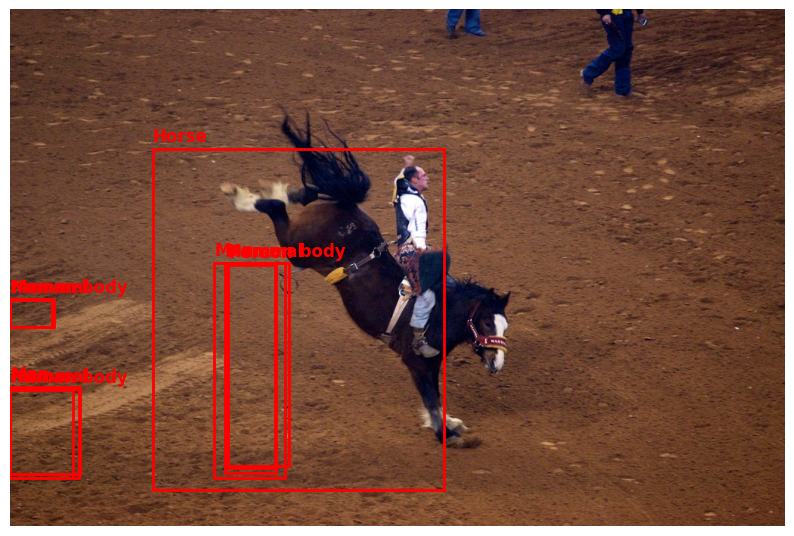

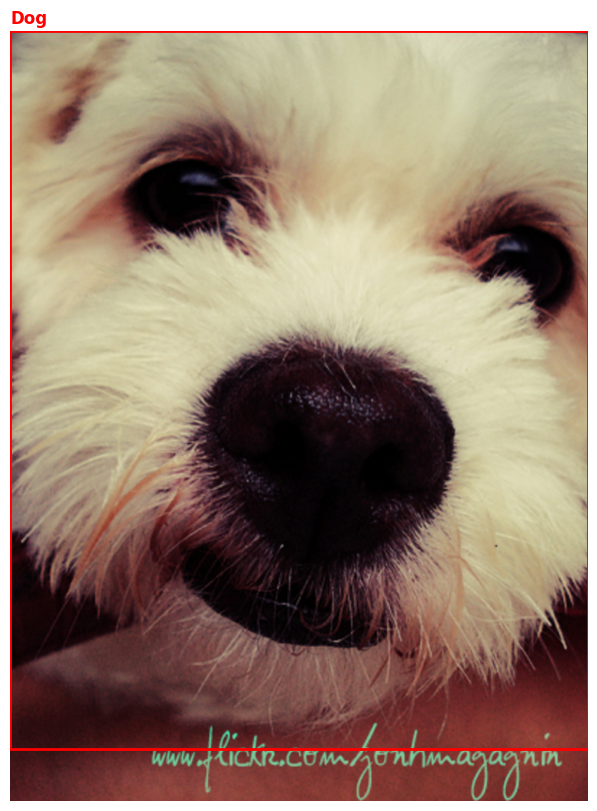

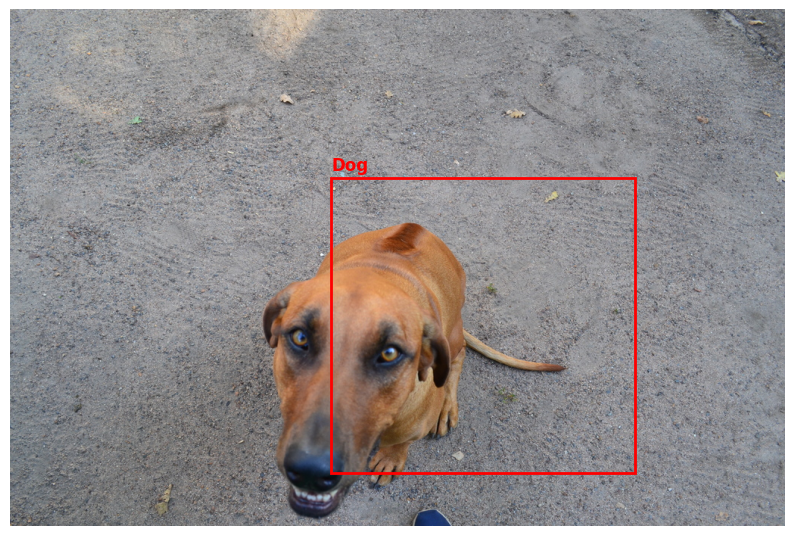

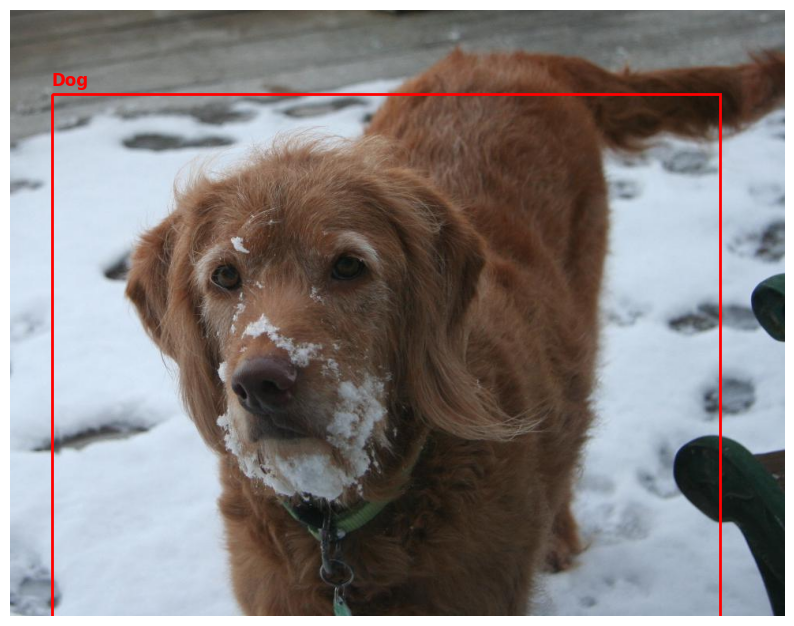

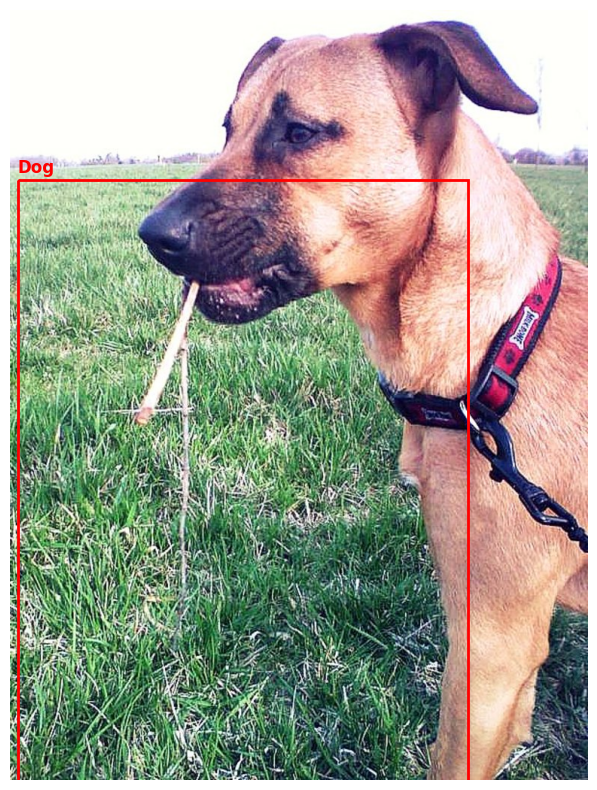

In [10]:
dataset = foz.load_zoo_dataset(
    "open-images-v6",
    split="validation",
    max_samples=3000,
    classes=["Cat", "Dog", "Elephant", "Tiger", "Horse", "Sheep"],
    label_types=["detections"]
)

# Lấy 5 mẫu đầu tiên để visualize
samples = dataset.take(5)

# Hàm để vẽ hình ảnh với bounding box
def plot_sample(sample):
    # Mở hình ảnh
    img = Image.open(sample.filepath)
    plt.figure(figsize=(10, 10))
    plt.imshow(img)

    # Vẽ bounding box và nhãn
    if sample.ground_truth and sample.ground_truth.detections:
        for detection in sample.ground_truth.detections:
            # Lấy tọa độ bounding box (định dạng [top, left, width, height] tương đối)
            box = detection.bounding_box
            img_width, img_height = img.size
            x = box[1] * img_width  # left
            y = box[0] * img_height  # top
            w = box[2] * img_width   # width
            h = box[3] * img_height  # height

            # Vẽ hộp bao quanh
            rect = plt.Rectangle((x, y), w, h, linewidth=2, edgecolor="r", facecolor="none")
            plt.gca().add_patch(rect)
            # Ghi nhãn
            plt.text(x, y-10, detection.label, color="r", fontsize=12, weight="bold")

    plt.axis("off")
    plt.show()

# Visualize từng mẫu
for sample in samples:
    plot_sample(sample)

In [11]:
# Define question and answer templates
count_questions = ["How many {class_name}s are in the image?"]
yes_no_questions = ["Is there a {class_name} in the image?"]
identification_questions = ["What animal is in the image?"]
comparative_questions = ["Are there more {class_name1}s than {class_name2}s in the image?"]

count_answers = ["There {are_is} {count} {class_name}{s} in the image."]
yes_no_answers = ["Yes, there is a {class_name} in the image.", "No, there is no {class_name} in the image."]
identification_answers = ["The animal in the image is a {class_name}.", "There is no animal in the image."]
comparative_answers = ["Yes, there are more {class_name1}s than {class_name2}s in the image.",
                       "No, there are not more {class_name1}s than {class_name2}s in the image."]

# Filter dataset for images with animals
selected_classes = ["Cat", "Dog", "Elephant", "Tiger", "Horse", "Sheep"]
animal_filter = fo.ViewField("ground_truth.detections").filter(
    fo.ViewField("label").is_in(selected_classes)
).length() > 0
filtered_dataset = dataset.match(animal_filter)

# Limit to 1000 samples after filtering
filtered_dataset = filtered_dataset.take(1000)

# Generate Q&A pairs for filtered dataset
vqa_data = []
for sample in filtered_dataset:
    img_path = sample.filepath
    detections = sample.ground_truth.detections if sample.ground_truth else []
    labels = [det.label for det in detections if det.label in selected_classes]
    label_counts = Counter(labels)

    # Count question for each class
    for class_name, count in label_counts.items():
        vqa_data.append({
            "image_path": img_path,
            "question": count_questions[0].format(class_name=class_name.lower()),
            "answer": count_answers[0].format(are_is="is" if count == 1 else "are", count=count, class_name=class_name.lower(), s="" if count == 1 else "s")
        })

    # Yes/no question for each class
    for class_name in selected_classes:
        answer = yes_no_answers[0].format(class_name=class_name.lower()) if class_name in label_counts else yes_no_answers[1].format(class_name=class_name.lower())
        vqa_data.append({
            "image_path": img_path,
            "question": yes_no_questions[0].format(class_name=class_name.lower()),
            "answer": answer
        })

    # Identification question
    if label_counts:
        most_common_class = label_counts.most_common(1)[0][0]
        vqa_data.append({
            "image_path": img_path,
            "question": identification_questions[0],
            "answer": identification_answers[0].format(class_name=most_common_class.lower())
        })
    else:
        vqa_data.append({
            "image_path": img_path,
            "question": identification_questions[0],
            "answer": identification_answers[1]
        })

    # Comparative question (compare pairs of classes)
    for i, class_name1 in enumerate(selected_classes):
        for class_name2 in selected_classes[i+1:]:
            count1 = label_counts.get(class_name1, 0)
            count2 = label_counts.get(class_name2, 0)
            answer = (comparative_answers[0] if count1 > count2 else comparative_answers[1]).format(
                class_name1=class_name1.lower(), class_name2=class_name2.lower()
            )
            vqa_data.append({
                "image_path": img_path,
                "question": comparative_questions[0].format(class_name1=class_name1.lower(), class_name2=class_name2.lower()),
                "answer": answer
            })

# Export images
export_dir = "animal_images"
filtered_dataset.export(export_dir=export_dir, dataset_type=fo.types.ImageDirectory)
logger.info(f"Exported {len(filtered_dataset)} images to {export_dir}")

# Update the dataset variable to the filtered dataset
dataset = filtered_dataset

Directory 'animal_images' already exists; export will be merged with existing files


 100% |███████████████| 1000/1000 [2.9s elapsed, 0s remaining, 344.3 samples/s]      


INFO:eta.core.utils: 100% |███████████████| 1000/1000 [2.9s elapsed, 0s remaining, 344.3 samples/s]      



=== Class Distribution in the Dataset ===
This shows how many images contain each class (Cat,Dog,Elephant,Tiger,Horse,Sheep) after filtering.
Class Distribution:
  Horse: 116 images
  Cat: 154 images
  Sheep: 29 images
  Dog: 679 images
  Elephant: 19 images
  Tiger: 5 images

=== Question Type Distribution ===
This shows how many questions of each type were generated.
Question Type Distribution:
  Are: 15000 questions
  What: 1000 questions
  Is: 6000 questions
  How: 1002 questions

=== Sample Q&A Pairs with Images ===
This shows a few examples of generated questions and answers with the corresponding images.
Showing 6 sample Q&A pairs with images:
  Question: Is there a tiger in the image?
  Answer: No, there is no tiger in the image.


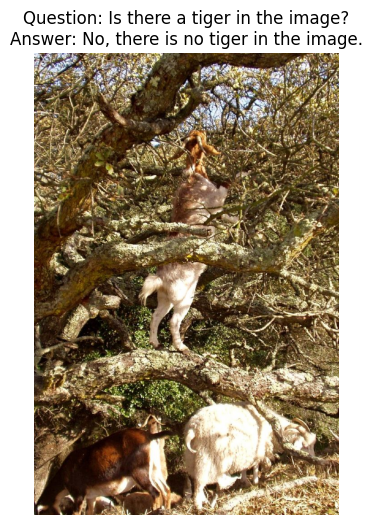


  Question: Are there more dogs than horses in the image?
  Answer: Yes, there are more dogs than horses in the image.


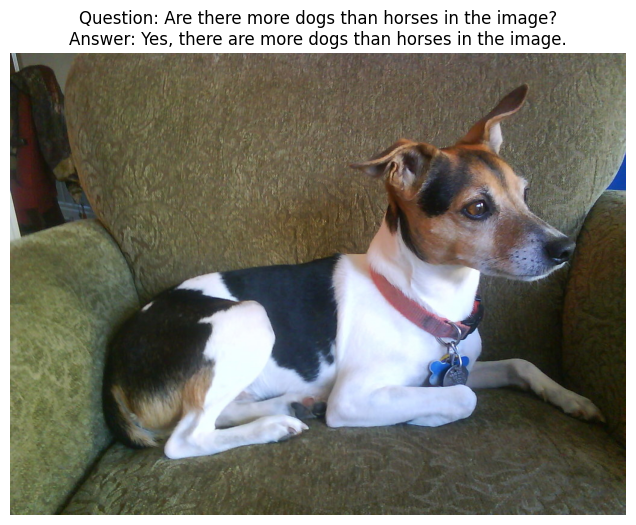


  Question: Are there more cats than tigers in the image?
  Answer: No, there are not more cats than tigers in the image.


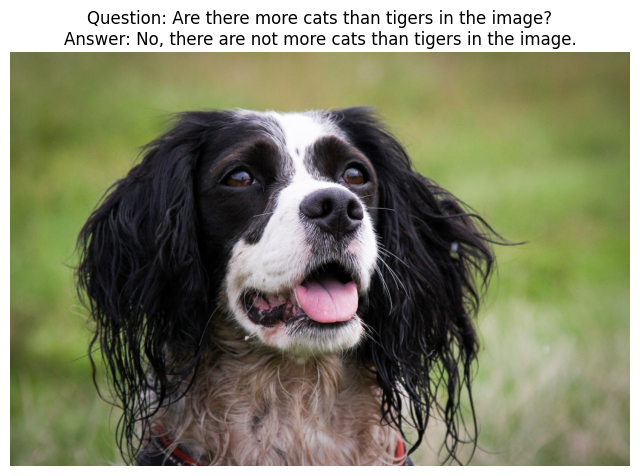


  Question: Is there a elephant in the image?
  Answer: No, there is no elephant in the image.


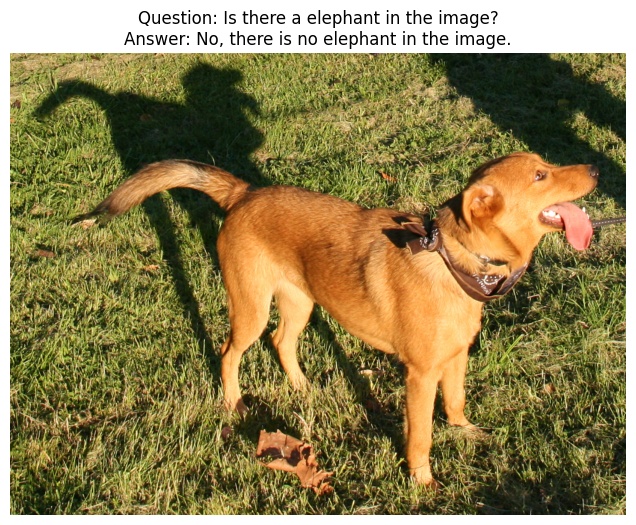


  Question: What animal is in the image?
  Answer: The animal in the image is a dog.


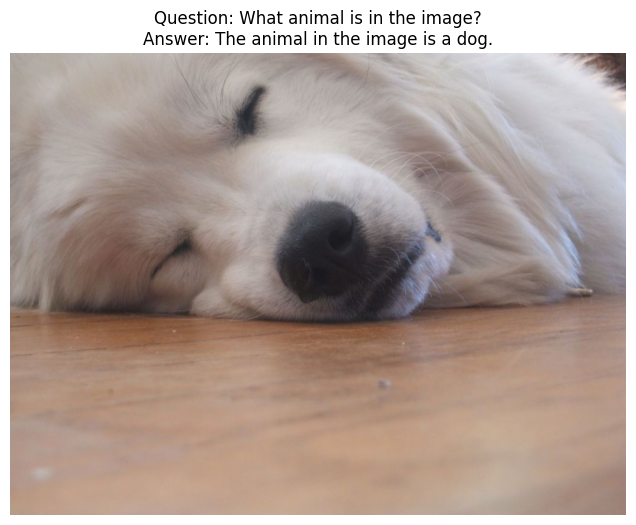


  Question: Are there more dogs than horses in the image?
  Answer: Yes, there are more dogs than horses in the image.


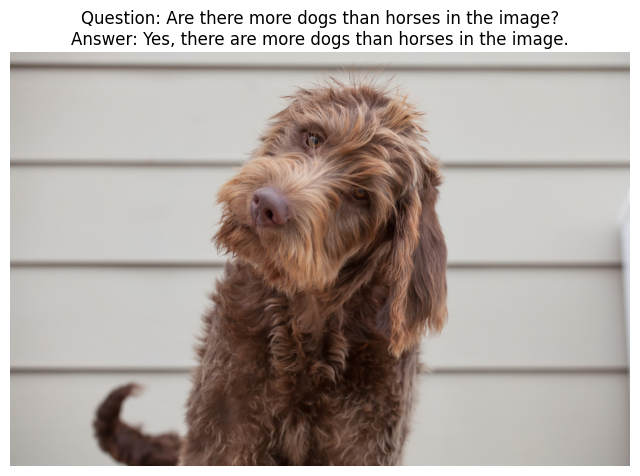

In [18]:
# Class Distribution in the Dataset
print("\n=== Class Distribution in the Dataset ===")
print("This shows how many images contain each class (Cat,Dog,Elephant,Tiger,Horse,Sheep) after filtering.")
class_counts = Counter()
for sample in filtered_dataset:
    detections = sample.ground_truth.detections if sample.ground_truth else []
    labels = [det.label for det in detections if det.label in selected_classes]
    for label in set(labels):  # Use set to count each class once per image
        class_counts[label] += 1

print("Class Distribution:")
for class_name, count in class_counts.items():
    print(f"  {class_name}: {count} images")

# Question Type Distribution
print("\n=== Question Type Distribution ===")
print("This shows how many questions of each type were generated.")
question_types = [item["question"].split()[0] for item in vqa_data]
question_type_counts = Counter(question_types)
print("Question Type Distribution:")
for q_type, count in question_type_counts.items():
    print(f"  {q_type}: {count} questions")

# Sample Q&A Pairs with Image Display
print("\n=== Sample Q&A Pairs with Images ===")
print("This shows a few examples of generated questions and answers with the corresponding images.")
num_samples = 6
sample_indices = random.sample(range(len(vqa_data)), num_samples)
print(f"Showing {num_samples} sample Q&A pairs with images:")

# Hiển thị ảnh inline trong Colab mà không in đường dẫn
for idx in sample_indices:
    item = vqa_data[idx]
    print(f"  Question: {item['question']}")
    print(f"  Answer: {item['answer']}")

    # Load và hiển thị ảnh
    try:
        img = mpimg.imread(item['image_path'])  # Đọc ảnh từ đường dẫn
        plt.figure(figsize=(8, 6))  # Kích thước ảnh
        plt.imshow(img)  # Hiển thị ảnh
        plt.title(f"Question: {item['question']}\nAnswer: {item['answer']}", fontsize=12)  # Tiêu đề
        plt.axis('off')  # Tắt trục tọa độ
        plt.show()  # Hiển thị inline trong Colab
    except Exception as e:
        print(f"  Error loading image: {e}")
    print()

## Step 2: Preprocessing for VQA

In [21]:
logger = logging.getLogger(__name__)

# Define image transformation with data augmentation
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Define question type mapping
question_type_to_idx = {"count": 0, "yes_no": 1, "identification": 2, "comparative": 3}

# Infer question type from question text
def infer_question_type(question):
    question = question.lower()
    if question.startswith("how many"):
        return "count"
    elif question.startswith("is there"):
        return "yes_no"
    elif question.startswith("what animal"):
        return "identification"
    elif question.startswith("are there more"):
        return "comparative"
    else:
        return "unknown"

# Add question type to vqa_data
for item in vqa_data:
    question_type = infer_question_type(item["question"])
    item["question_type"] = question_type_to_idx[question_type]
    # In mẫu: Kiểm tra loại câu hỏi của một số mục
    if random.random() < 0.01:  # In ngẫu nhiên 1% dữ liệu
        print(f"Question: {item['question']}, Inferred Type: {question_type}")

# Build vocabulary
vocab = {"<pad>": 0, "<start>": 1, "<end>": 2, "<unk>": 3}
for item in vqa_data:
    question_words = word_tokenize(item["question"].lower())
    answer_words = word_tokenize(item["answer"].lower())
    for word in question_words + answer_words:
        if word not in vocab:
            vocab[word] = len(vocab)
inv_vocab = {v: k for k, v in vocab.items()}
logger.info(f"Vocabulary size: {len(vocab)}")
# In mẫu: Một số từ trong từ vựng
print("Sample vocabulary (first 10 items):", list(vocab.items())[:10])

# Encode text
def encode_text(text, max_length, vocab):
    tokens = ["<start>"] + word_tokenize(text.lower()) + ["<end>"]
    token_ids = [vocab.get(token, vocab["<unk>"]) for token in tokens]
    if len(token_ids) < max_length:
        token_ids += [vocab["<pad>"]] * (max_length - len(token_ids))
    else:
        token_ids = token_ids[:max_length]
    return torch.tensor(token_ids, dtype=torch.long)

# Custom dataset class
class VQADataset(torch.utils.data.Dataset):
    def __init__(self, vqa_data, transform, max_seq_length, vocab):
        self.vqa_data = vqa_data
        self.transform = transform
        self.max_seq_length = max_seq_length
        self.vocab = vocab
        self.inv_vocab = {v: k for k, v in vocab.items()}
        self.data = vqa_data
        self._dataset = dataset

    def __len__(self):
        return len(self.vqa_data)

    def __getitem__(self, idx):
        item = self.vqa_data[idx]
        image = Image.open(item["image_path"]).convert("RGB")
        image = self.transform(image)
        question = encode_text(item["question"], self.max_seq_length, self.vocab)
        answer = encode_text(item["answer"], self.max_seq_length, self.vocab)
        question_type = item["question_type"]
        # In mẫu: Kiểm tra dữ liệu của một mục
        if idx < 1:  # In dữ liệu của mục đầu tiên
            print(f"Sample item at index {idx}:")
            print(f"  Image shape: {image.shape}")
            print(f"  Question tokens: {question.tolist()}")
            print(f"  Answer tokens: {answer.tolist()}")
            print(f"  Question type: {question_type}")
        return {"image": image, "question": question, "answer": answer, "image_path": item["image_path"], "question_type": question_type}

# Create train/validation/test split
random.shuffle(vqa_data)
train_size = int(0.7 * len(vqa_data))
val_size = int(0.15 * len(vqa_data))
train_vqa_data = vqa_data[:train_size]
val_vqa_data = vqa_data[train_size:train_size + val_size]
test_vqa_data = vqa_data[train_size + val_size:]
# In kích thước các tập
print(f"Train size: {len(train_vqa_data)}, Validation size: {len(val_vqa_data)}, Test size: {len(test_vqa_data)}")

# Create datasets and data loaders
max_seq_length = 20
train_dataset = VQADataset(train_vqa_data, transform, max_seq_length, vocab)
val_dataset = VQADataset(val_vqa_data, transform, max_seq_length, vocab)
test_dataset = VQADataset(test_vqa_data, transform, max_seq_length, vocab)
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=4, pin_memory=True)
logger.info(f"Training data: {len(train_vqa_data)} samples, Validation data: {len(val_vqa_data)} samples, Test data: {len(test_vqa_data)} samples")

# In mẫu: Kiểm tra một batch từ train_loader
for batch in train_loader:
    print("Sample batch from train_loader:")
    print(f"  Image batch shape: {batch['image'].shape}")
    print(f"  Question batch shape: {batch['question'].shape}")
    print(f"  Answer batch shape: {batch['answer'].shape}")
    print(f"  Question type batch: {batch['question_type']}")
    break  # Chỉ in batch đầu tiên

Question: What animal is in the image?, Inferred Type: identification
Question: Are there more horses than sheeps in the image?, Inferred Type: comparative
Question: Is there a tiger in the image?, Inferred Type: yes_no
Question: Are there more dogs than tigers in the image?, Inferred Type: comparative
Question: Are there more cats than dogs in the image?, Inferred Type: comparative
Question: Are there more dogs than horses in the image?, Inferred Type: comparative
Question: Are there more elephants than tigers in the image?, Inferred Type: comparative
Question: Are there more elephants than horses in the image?, Inferred Type: comparative
Question: Is there a sheep in the image?, Inferred Type: yes_no
Question: Are there more cats than tigers in the image?, Inferred Type: comparative
Question: Is there a dog in the image?, Inferred Type: yes_no
Question: Are there more cats than sheeps in the image?, Inferred Type: comparative
Question: Is there a sheep in the image?, Inferred Type: y


=== Dataset Split Sizes ===
This shows how the dataset is split into training, validation, and test sets.
Total samples: 23002
Training set: 16101 samples (70.0%)
Validation set: 3450 samples (15.0%)
Test set: 3451 samples (15.0%)

=== Sample Preprocessed Data ===
This shows 6 samples of the preprocessed data (image tensor shape, tokenized question/answer, and the image).
Sample index: 10502
Image tensor shape: torch.Size([3, 224, 224])
Question tokens: <start> are there more cats than sheeps in the image ? <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
Answer tokens: <start> no , there are not more cats than sheeps in the image . <end> <pad> <pad> <pad> <pad> <pad>


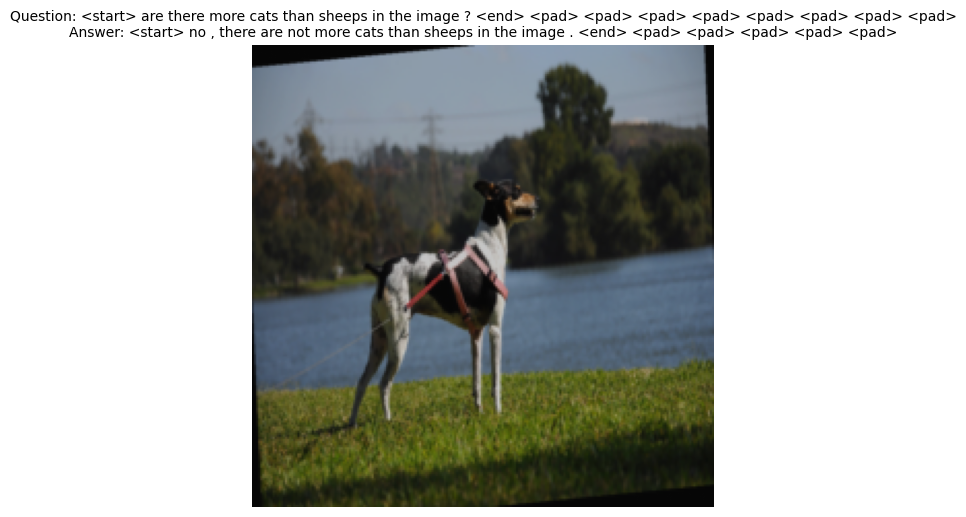


Sample index: 2804
Image tensor shape: torch.Size([3, 224, 224])
Question tokens: <start> are there more cats than horses in the image ? <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
Answer tokens: <start> no , there are not more cats than horses in the image . <end> <pad> <pad> <pad> <pad> <pad>


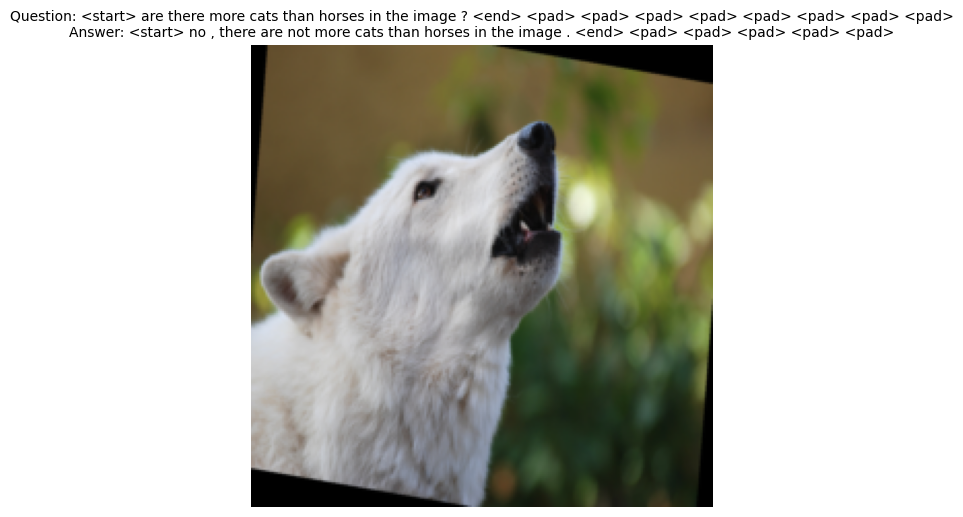


Sample index: 12096
Image tensor shape: torch.Size([3, 224, 224])
Question tokens: <start> how many dogs are in the image ? <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
Answer tokens: <start> there are 2 dogs in the image . <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>


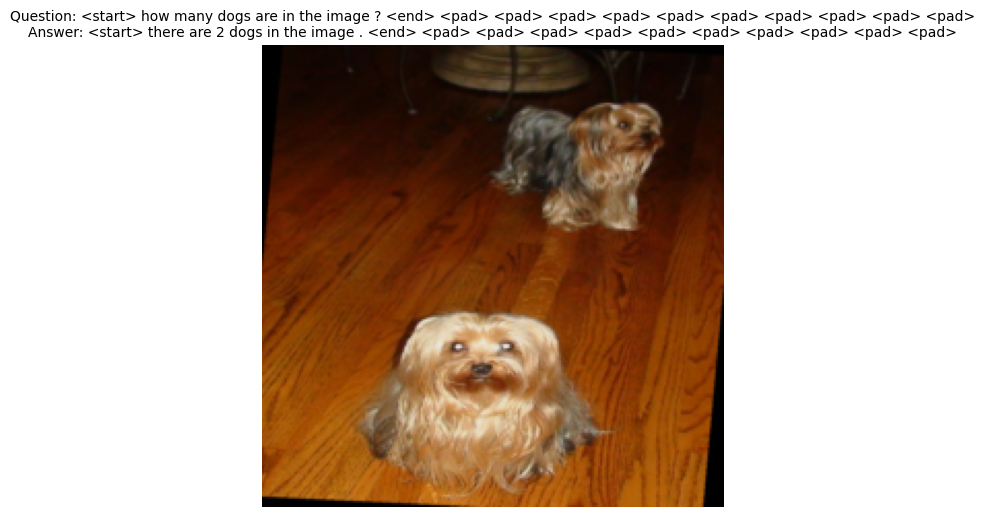


Sample index: 15887
Image tensor shape: torch.Size([3, 224, 224])
Question tokens: <start> how many cats are in the image ? <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
Answer tokens: <start> there are 2 cats in the image . <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>


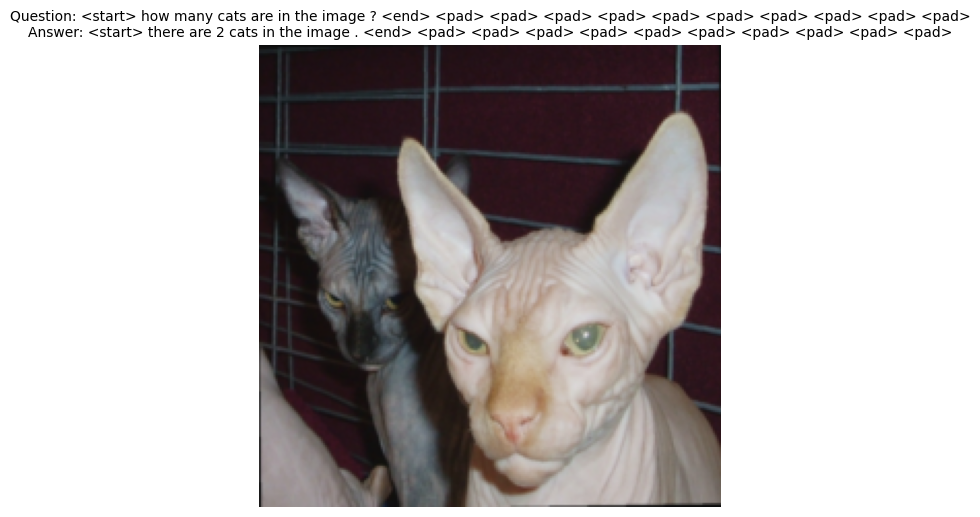


Sample index: 10751
Image tensor shape: torch.Size([3, 224, 224])
Question tokens: <start> are there more cats than dogs in the image ? <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
Answer tokens: <start> no , there are not more cats than dogs in the image . <end> <pad> <pad> <pad> <pad> <pad>


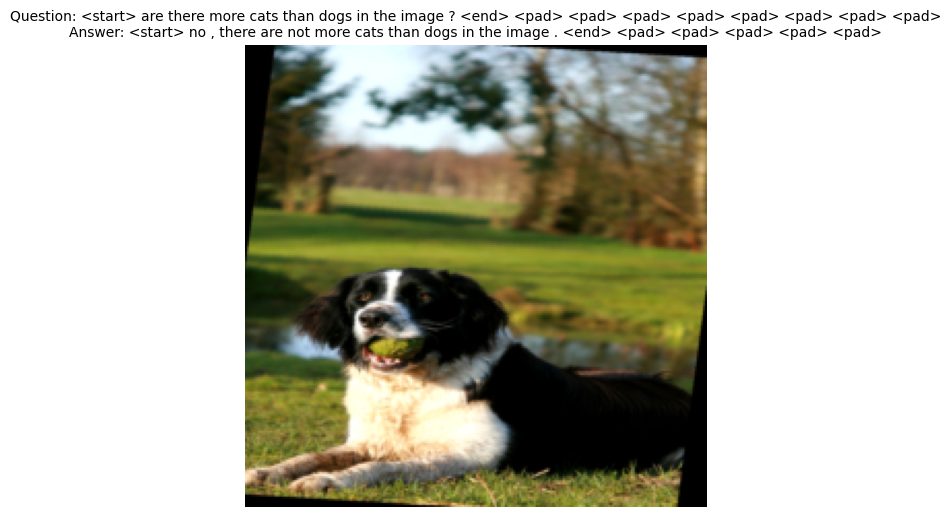


Sample index: 2250
Image tensor shape: torch.Size([3, 224, 224])
Question tokens: <start> are there more cats than sheeps in the image ? <end> <pad> <pad> <pad> <pad> <pad> <pad> <pad> <pad>
Answer tokens: <start> no , there are not more cats than sheeps in the image . <end> <pad> <pad> <pad> <pad> <pad>


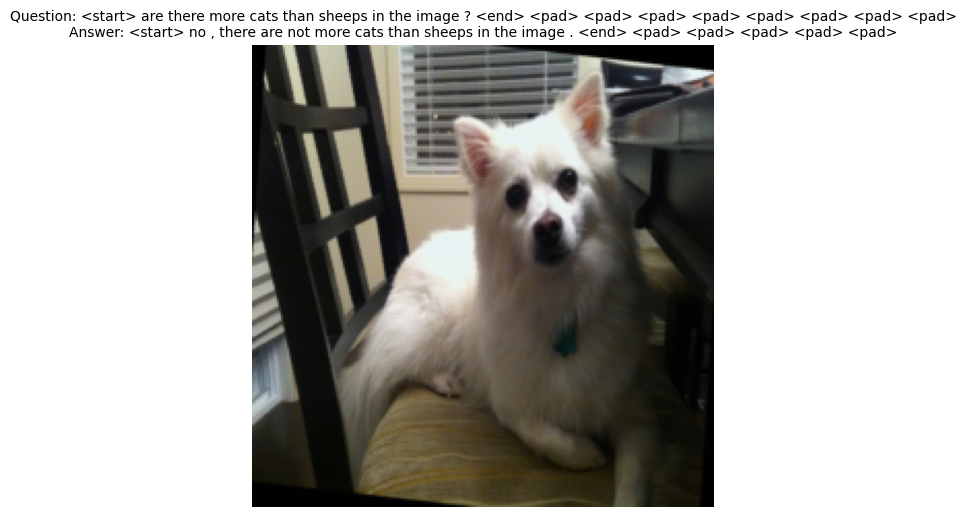

In [24]:

# Show the number of samples in each split
print("\n=== Dataset Split Sizes ===")
print("This shows how the dataset is split into training, validation, and test sets.")
print(f"Total samples: {len(vqa_data)}")
print(f"Training set: {len(train_vqa_data)} samples ({len(train_vqa_data)/len(vqa_data)*100:.1f}%)")
print(f"Validation set: {len(val_vqa_data)} samples ({len(val_vqa_data)/len(vqa_data)*100:.1f}%)")
print(f"Test set: {len(test_vqa_data)} samples ({len(test_vqa_data)/len(vqa_data)*100:.1f}%)")

# Hàm để chuyển đổi tensor ảnh về định dạng hiển thị
def denormalize_image(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    tensor = tensor.clone()  # Tạo bản sao để không thay đổi tensor gốc
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)  # Đảo ngược chuẩn hóa: (tensor * std) + mean
    tensor = tensor.clamp(0, 1)  # Giới hạn giá trị trong [0, 1]
    tensor = tensor.permute(1, 2, 0)  # Chuyển từ [C, H, W] sang [H, W, C]
    return tensor.numpy()

# Sample Preprocessed Data with Image Display
# Show 6 samples of preprocessed data (image shape, tokenized text, and the image itself)
print("\n=== Sample Preprocessed Data ===")
print("This shows 6 samples of the preprocessed data (image tensor shape, tokenized question/answer, and the image).")
num_samples = 6  # Số mẫu muốn hiển thị
sample_indices = random.sample(range(len(train_dataset)), num_samples)  # Chọn ngẫu nhiên 6 chỉ số

for sample_idx in sample_indices:
    sample = train_dataset[sample_idx]
    image_shape = sample["image"].shape
    question_tokens = [inv_vocab[token.item()] for token in sample["question"] if token.item() in inv_vocab]
    answer_tokens = [inv_vocab[token.item()] for token in sample["answer"] if token.item() in inv_vocab]
    print(f"Sample index: {sample_idx}")
    print(f"Image tensor shape: {image_shape}")
    print(f"Question tokens: {' '.join(question_tokens)}")
    print(f"Answer tokens: {' '.join(answer_tokens)}")

    # Hiển thị ảnh
    try:
        image = denormalize_image(sample["image"])  # Chuyển tensor ảnh về định dạng hiển thị
        plt.figure(figsize=(6, 6))  # Kích thước ảnh
        plt.imshow(image)  # Hiển thị ảnh
        plt.title(f"Question: {' '.join(question_tokens)}\nAnswer: {' '.join(answer_tokens)}", fontsize=10)
        plt.axis('off')  # Tắt trục tọa độ
        plt.show()  # Hiển thị trong Colab hoặc môi trường tương thích
    except Exception as e:
        print(f"Error displaying image: {e}")
    print()  # Thêm dòng trống giữa các mẫu

# Task 2: CNN-LSTM

## Step 3: Define the CNN-LSTM VQA Model

In [ ]:
class Attention(nn.Module):
    def __init__(self, hidden_dim, dropout_rate=0.5):
        super(Attention, self).__init__()
        self.hidden_dim = hidden_dim
        self.attn = nn.Linear(hidden_dim * 2, hidden_dim)
        self.v = nn.Parameter(torch.rand(hidden_dim))
        self.tanh = nn.Tanh()
        self.softmax = nn.Softmax(dim=1)
        self.dropout = nn.Dropout(dropout_rate)

    def forward(self, hidden, img_features):
        if len(img_features.shape) == 2:
            img_features = img_features.unsqueeze(1)
        batch_size, seq_len, hidden_dim = img_features.size()
        hidden = hidden.unsqueeze(1).repeat(1, seq_len, 1)
        energy = self.tanh(self.attn(torch.cat((hidden, img_features), dim=2)))
        energy = self.dropout(energy)
        energy = energy @ self.v
        attn_weights = self.softmax(energy)
        context = torch.bmm(attn_weights.unsqueeze(1), img_features).squeeze(1)
        return context, attn_weights

class VQAModel(nn.Module):
    def __init__(self, vocab_size, selected_classes, use_pretrained=True, use_attention=True, embed_dim=256, hidden_dim=512, dropout_rate=0.5):
        super(VQAModel, self).__init__()
        self.hidden_dim = hidden_dim
        self.vocab_size = vocab_size
        self.selected_classes = selected_classes
        self.use_attention = use_attention

        # CNN for image features
        self.cnn = models.resnet18(pretrained=use_pretrained)
        self.cnn.fc = nn.Identity()
        self.cnn_project = nn.Linear(512, hidden_dim)
        self.batch_norm = nn.BatchNorm1d(hidden_dim)

        # Question encoding
        self.embedding = nn.Embedding(vocab_size, embed_dim, padding_idx=0)
        self.lstm_question = nn.LSTM(embed_dim, hidden_dim, batch_first=True, num_layers=2, dropout=dropout_rate)

        # Class embedding for target class
        self.class_embedding = nn.Embedding(len(selected_classes) + 1, embed_dim)  # +1 for "unknown" class
        self.class_to_idx = {cls.lower(): idx for idx, cls in enumerate(selected_classes)}
        self.class_to_idx["unknown"] = len(selected_classes)

        # Question type classifier (count, yes/no, identification, comparative)
        self.question_type_classifier = nn.Sequential(
            nn.Linear(hidden_dim, hidden_dim // 2),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(hidden_dim // 2, 4)  # 4 question types
        )
        self.question_types = ["count", "yes_no", "identification", "comparative"]

        # Answer generation
        if self.use_attention:
            self.attention = Attention(hidden_dim, dropout_rate)
        self.lstm_answer = nn.LSTM(hidden_dim + embed_dim + embed_dim + embed_dim, hidden_dim, batch_first=True)
        self.question_type_embedding = nn.Embedding(4, embed_dim)  # Embed question type
        self.fc = nn.Linear(hidden_dim, vocab_size)
        self.dropout = nn.Dropout(dropout_rate)

    def extract_target_class(self, question):
        batch_size = question.size(0)
        target_classes = torch.zeros(batch_size, dtype=torch.long).to(device)
        for i in range(batch_size):
            question_tokens = [inv_vocab[token.item()] for token in question[i] if token.item() in inv_vocab]
            question_text = " ".join(question_tokens)
            target_class = "unknown"
            for cls in self.selected_classes:
                if cls.lower() in question_text:
                    target_class = cls.lower()
                    break
            target_classes[i] = self.class_to_idx[target_class]
        return target_classes

    def forward(self, images, questions, answers=None):
        # Extract image features
        with torch.no_grad():
            x = self.cnn.conv1(images)
            x = self.cnn.bn1(x)
            x = self.cnn.relu(x)
            x = self.cnn.maxpool(x)
            x = self.cnn.layer1(x)
            x = self.cnn.layer2(x)
            x = self.cnn.layer3(x)
            x = self.cnn.layer4(x)
        img_features = x.permute(0, 2, 3, 1).contiguous().view(x.size(0), -1, 512)
        img_features = self.cnn_project(img_features)
        img_features = img_features.mean(dim=1)
        img_features = self.batch_norm(img_features)

        # Encode question
        question_embed = self.embedding(questions)
        _, (question_hidden, _) = self.lstm_question(question_embed)
        question_hidden = self.dropout(question_hidden[-1])

        # Predict question type
        question_type_logits = self.question_type_classifier(question_hidden)
        question_type = question_type_logits.argmax(dim=-1)
        question_type_embed = self.question_type_embedding(question_type)

        # Extract and embed target class
        target_classes = self.extract_target_class(questions)
        class_embed = self.class_embedding(target_classes)

        # Generate answer
        if answers is not None:
            answer_embed = self.embedding(answers)
            outputs = []
            hidden = (torch.zeros(1, images.size(0), self.hidden_dim).to(device),
                      torch.zeros(1, images.size(0), self.hidden_dim).to(device))
            for t in range(answers.size(1)):
                if self.use_attention:
                    context, _ = self.attention(question_hidden, img_features.unsqueeze(1))
                else:
                    context = img_features
                word_embed = answer_embed[:, t, :].unsqueeze(1)
                lstm_input = torch.cat((context.unsqueeze(1), word_embed, class_embed.unsqueeze(1), question_type_embed.unsqueeze(1)), dim=2)
                lstm_out, hidden = self.lstm_answer(lstm_input, hidden)
                output = self.fc(self.dropout(lstm_out.squeeze(1)))
                outputs.append(output)
            return torch.stack(outputs, dim=1).contiguous(), question_type_logits
        else:
            answer_tokens = []
            token = torch.tensor([1] * images.size(0)).to(device)  # <start>
            hidden = (torch.zeros(1, images.size(0), self.hidden_dim).to(device),
                      torch.zeros(1, images.size(0), self.hidden_dim).to(device))
            for t in range(20):
                if self.use_attention:
                    context, _ = self.attention(question_hidden, img_features.unsqueeze(1))
                else:
                    context = img_features
                word_embed = self.embedding(token).unsqueeze(1)
                lstm_input = torch.cat((context.unsqueeze(1), word_embed, class_embed.unsqueeze(1), question_type_embed.unsqueeze(1)), dim=2)
                lstm_out, hidden = self.lstm_answer(lstm_input, hidden)
                output = self.fc(self.dropout(lstm_out.squeeze(1)))
                token = output.argmax(dim=-1)
                answer_tokens.append(output)
                if (token == 2).all():  # <end>
                    break
            return torch.stack(answer_tokens, dim=1).contiguous(), question_type_logits

In [ ]:
# Model Configuration
# Show the model configuration and parameter count
print("\n=== Model Configuration ===")
print("This shows the configuration of the VQA model and the number of trainable parameters.")
model = VQAModel(vocab_size=len(vocab), selected_classes=selected_classes, use_pretrained=True, use_attention=True).to(device)
print("Model Configuration:")
print(f"  Vocabulary size: {model.vocab_size}")
print(f"  Selected classes: {model.selected_classes}")
print(f"  Use pretrained CNN: True")
print(f"  Use attention mechanism: True")
print(f"  Embedding dimension: 256")
print(f"  Hidden dimension: 512")
print(f"  Dropout rate: 0.5")
print(f"Number of trainable parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad)}")


=== Model Configuration ===
This shows the configuration of the VQA model and the number of trainable parameters.


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Model Configuration:
  Vocabulary size: 33
  Selected classes: ['Dog', 'Horse', 'Cat']
  Use pretrained CNN: True
  Use attention mechanism: True
  Embedding dimension: 256
  Hidden dimension: 512
  Dropout rate: 0.5
Number of trainable parameters: 19477605


## Step 4: Train the Model


Training model: pretrained_True_attention_True


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/amp/grad_scaler.py:132: UserWarning: torch.cuda.amp.GradScaler is enabled, but CUDA is not available.  Disabling.
  warnings.warn(
Epoch 1

Epoch 1, Training Loss (pretrained_True_attention_True): 1.3734, Training Accuracy: 0.2583


Epoch 1, Validation Loss (pretrained_True_attention_True): 0.2682, Validation Accuracy: 0.5978
Epoch 1, Test Loss (pretrained_True_attention_True): 0.2695, Test Accuracy: 0.5666


Epoch 2 (pretrained_True_attention_True): 100%|██████████| 60/60 [01:51<00:00,  1.86s/it]

Epoch 2, Training Loss (pretrained_True_attention_True): 0.1751, Training Accuracy: 0.7393


Epoch 2, Validation Loss (pretrained_True_attention_True): 0.1329, Validation Accuracy: 0.7083
Epoch 2, Test Loss (pretrained_True_attention_True): 0.1382, Test Accuracy: 0.6927


Epoch 3 (pretrained_True_attention_True): 100%|██████████| 60/60 [01:48<00:00,  1.81s/it]

Epoch 3, Training Loss (pretrained_True_attention_True): 0.1172, Training Accuracy: 0.7862


Epoch 3, Validation Loss (pretrained_True_attention_True): 0.1064, Validation Accuracy: 0.7628
Epoch 3, Test Loss (pretrained_True_attention_True): 0.1072, Test Accuracy: 0.7792


Epoch 4 (pretrained_True_attention_True): 100%|██████████| 60/60 [01:50<00:00,  1.83s/it]

Epoch 4, Training Loss (pretrained_True_attention_True): 0.0981, Training Accuracy: 0.8210


Epoch 4, Validation Loss (pretrained_True_attention_True): 0.0916, Validation Accuracy: 0.7516
Epoch 4, Test Loss (pretrained_True_attention_True): 0.0913, Test Accuracy: 0.7936


Epoch 5 (pretrained_True_attention_True): 100%|██████████| 60/60 [01:48<00:00,  1.81s/it]

Epoch 5, Training Loss (pretrained_True_attention_True): 0.0670, Training Accuracy: 0.8344


Epoch 5, Validation Loss (pretrained_True_attention_True): 0.0370, Validation Accuracy: 0.8237
Epoch 5, Test Loss (pretrained_True_attention_True): 0.0383, Test Accuracy: 0.8140


Epoch 6 (pretrained_True_attention_True): 100%|██████████| 60/60 [01:48<00:00,  1.80s/it]

Epoch 6, Training Loss (pretrained_True_attention_True): 0.0334, Training Accuracy: 0.8397


Epoch 6, Validation Loss (pretrained_True_attention_True): 0.0328, Validation Accuracy: 0.8269
Epoch 6, Test Loss (pretrained_True_attention_True): 0.0359, Test Accuracy: 0.8007


Epoch 7 (pretrained_True_attention_True): 100%|██████████| 60/60 [01:48<00:00,  1.81s/it]

Epoch 7, Training Loss (pretrained_True_attention_True): 0.0280, Training Accuracy: 0.8557


Epoch 7, Validation Loss (pretrained_True_attention_True): 0.0330, Validation Accuracy: 0.8622
Epoch 7, Test Loss (pretrained_True_attention_True): 0.0347, Test Accuracy: 0.8391


Epoch 8 (pretrained_True_attention_True): 100%|██████████| 60/60 [01:53<00:00,  1.89s/it]

Epoch 8, Training Loss (pretrained_True_attention_True): 0.0264, Training Accuracy: 0.8594


Epoch 8, Validation Loss (pretrained_True_attention_True): 0.0321, Validation Accuracy: 0.7804
Epoch 8, Test Loss (pretrained_True_attention_True): 0.0344, Test Accuracy: 0.7936


Epoch 9 (pretrained_True_attention_True): 100%|██████████| 60/60 [01:48<00:00,  1.81s/it]

Epoch 9, Training Loss (pretrained_True_attention_True): 0.0254, Training Accuracy: 0.8635


Epoch 9, Validation Loss (pretrained_True_attention_True): 0.0340, Validation Accuracy: 0.8109
Epoch 9, Test Loss (pretrained_True_attention_True): 0.0354, Test Accuracy: 0.7984


Epoch 10 (pretrained_True_attention_True): 100%|██████████| 60/60 [01:48<00:00,  1.81s/it]

Epoch 10, Training Loss (pretrained_True_attention_True): 0.0266, Training Accuracy: 0.8539


Epoch 10, Validation Loss (pretrained_True_attention_True): 0.0304, Validation Accuracy: 0.7997
Epoch 10, Test Loss (pretrained_True_attention_True): 0.0339, Test Accuracy: 0.7996


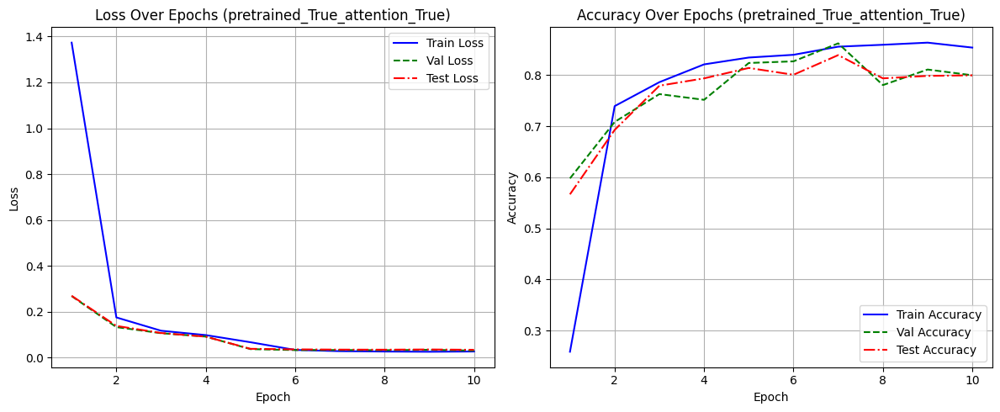


Training model: pretrained_True_attention_False


Epoch 1 (pretrained_True_attention_False): 100%|██████████| 60/60 [01:45<00:00,  1.76s/it]

Epoch 1, Training Loss (pretrained_True_attention_False): 1.4040, Training Accuracy: 0.2504


Epoch 1, Validation Loss (pretrained_True_attention_False): 0.1999, Validation Accuracy: 0.6346
Epoch 1, Test Loss (pretrained_True_attention_False): 0.2086, Test Accuracy: 0.5869


Epoch 2 (pretrained_True_attention_False): 100%|██████████| 60/60 [01:47<00:00,  1.79s/it]

Epoch 2, Training Loss (pretrained_True_attention_False): 0.1230, Training Accuracy: 0.7155


Epoch 2, Validation Loss (pretrained_True_attention_False): 0.0829, Validation Accuracy: 0.7372
Epoch 2, Test Loss (pretrained_True_attention_False): 0.0867, Test Accuracy: 0.7108


Epoch 3 (pretrained_True_attention_False): 100%|██████████| 60/60 [01:46<00:00,  1.77s/it]

Epoch 3, Training Loss (pretrained_True_attention_False): 0.0650, Training Accuracy: 0.7955


Epoch 3, Validation Loss (pretrained_True_attention_False): 0.0587, Validation Accuracy: 0.7756
Epoch 3, Test Loss (pretrained_True_attention_False): 0.0616, Test Accuracy: 0.7696


Epoch 4 (pretrained_True_attention_False): 100%|██████████| 60/60 [01:45<00:00,  1.76s/it]

Epoch 4, Training Loss (pretrained_True_attention_False): 0.0479, Training Accuracy: 0.8007


Epoch 4, Validation Loss (pretrained_True_attention_False): 0.0431, Validation Accuracy: 0.7163
Epoch 4, Test Loss (pretrained_True_attention_False): 0.0442, Test Accuracy: 0.7600


Epoch 5 (pretrained_True_attention_False): 100%|██████████| 60/60 [01:46<00:00,  1.78s/it]

Epoch 5, Training Loss (pretrained_True_attention_False): 0.0384, Training Accuracy: 0.8187


Epoch 5, Validation Loss (pretrained_True_attention_False): 0.0421, Validation Accuracy: 0.8157
Epoch 5, Test Loss (pretrained_True_attention_False): 0.0442, Test Accuracy: 0.8033


Epoch 6 (pretrained_True_attention_False): 100%|██████████| 60/60 [01:46<00:00,  1.78s/it]

Epoch 6, Training Loss (pretrained_True_attention_False): 0.0317, Training Accuracy: 0.8650


Epoch 6, Validation Loss (pretrained_True_attention_False): 0.0349, Validation Accuracy: 0.7933
Epoch 6, Test Loss (pretrained_True_attention_False): 0.0382, Test Accuracy: 0.7996


Epoch 7 (pretrained_True_attention_False): 100%|██████████| 60/60 [01:45<00:00,  1.76s/it]

Epoch 7, Training Loss (pretrained_True_attention_False): 0.0282, Training Accuracy: 0.8531


Epoch 7, Validation Loss (pretrained_True_attention_False): 0.0347, Validation Accuracy: 0.7949
Epoch 7, Test Loss (pretrained_True_attention_False): 0.0383, Test Accuracy: 0.7840


Epoch 8 (pretrained_True_attention_False): 100%|██████████| 60/60 [01:47<00:00,  1.79s/it]

Epoch 8, Training Loss (pretrained_True_attention_False): 0.0253, Training Accuracy: 0.8637


Epoch 8, Validation Loss (pretrained_True_attention_False): 0.0317, Validation Accuracy: 0.8269
Epoch 8, Test Loss (pretrained_True_attention_False): 0.0356, Test Accuracy: 0.7947


Epoch 9 (pretrained_True_attention_False): 100%|██████████| 60/60 [01:47<00:00,  1.79s/it]

Epoch 9, Training Loss (pretrained_True_attention_False): 0.0260, Training Accuracy: 0.8570


Epoch 9, Validation Loss (pretrained_True_attention_False): 0.0306, Validation Accuracy: 0.8013
Epoch 9, Test Loss (pretrained_True_attention_False): 0.0324, Test Accuracy: 0.7840


Epoch 10 (pretrained_True_attention_False): 100%|██████████| 60/60 [01:47<00:00,  1.80s/it]

Epoch 10, Training Loss (pretrained_True_attention_False): 0.0249, Training Accuracy: 0.8625


Epoch 10, Validation Loss (pretrained_True_attention_False): 0.0331, Validation Accuracy: 0.8109
Epoch 10, Test Loss (pretrained_True_attention_False): 0.0356, Test Accuracy: 0.8188


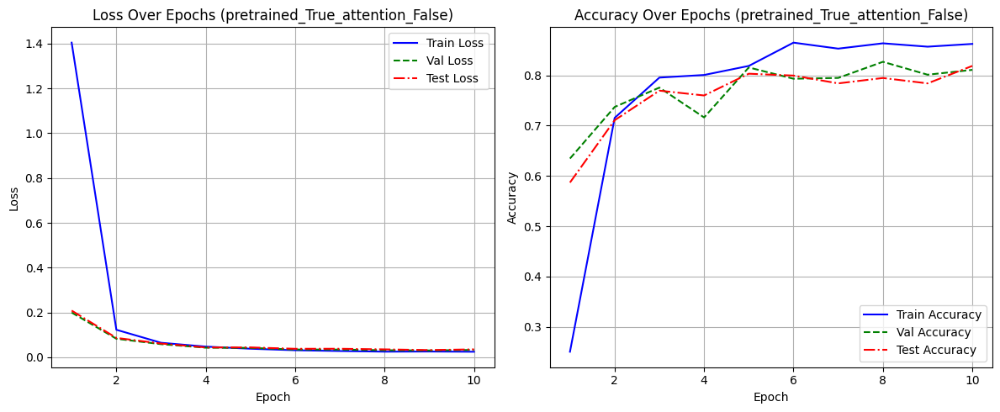

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)



Training model: pretrained_False_attention_True


Epoch 1 (pretrained_False_attention_True): 100%|██████████| 60/60 [01:50<00:00,  1.85s/it]

Epoch 1, Training Loss (pretrained_False_attention_True): 1.3414, Training Accuracy: 0.3018


Epoch 1, Validation Loss (pretrained_False_attention_True): 0.2630, Validation Accuracy: 0.5449
Epoch 1, Test Loss (pretrained_False_attention_True): 0.2726, Test Accuracy: 0.5126


Epoch 2 (pretrained_False_attention_True): 100%|██████████| 60/60 [01:50<00:00,  1.85s/it]

Epoch 2, Training Loss (pretrained_False_attention_True): 0.2001, Training Accuracy: 0.6754


Epoch 2, Validation Loss (pretrained_False_attention_True): 0.1491, Validation Accuracy: 0.7067
Epoch 2, Test Loss (pretrained_False_attention_True): 0.1558, Test Accuracy: 0.6697


Epoch 3 (pretrained_False_attention_True): 100%|██████████| 60/60 [01:49<00:00,  1.83s/it]

Epoch 3, Training Loss (pretrained_False_attention_True): 0.1401, Training Accuracy: 0.7015


Epoch 3, Validation Loss (pretrained_False_attention_True): 0.1298, Validation Accuracy: 0.7179
Epoch 3, Test Loss (pretrained_False_attention_True): 0.1379, Test Accuracy: 0.6697


Epoch 4 (pretrained_False_attention_True): 100%|██████████| 60/60 [01:49<00:00,  1.83s/it]

Epoch 4, Training Loss (pretrained_False_attention_True): 0.1325, Training Accuracy: 0.6917


Epoch 4, Validation Loss (pretrained_False_attention_True): 0.1258, Validation Accuracy: 0.7228
Epoch 4, Test Loss (pretrained_False_attention_True): 0.1292, Test Accuracy: 0.6746


Epoch 5 (pretrained_False_attention_True): 100%|██████████| 60/60 [01:49<00:00,  1.83s/it]

Epoch 5, Training Loss (pretrained_False_attention_True): 0.1257, Training Accuracy: 0.6960


Epoch 5, Validation Loss (pretrained_False_attention_True): 0.1237, Validation Accuracy: 0.7131
Epoch 5, Test Loss (pretrained_False_attention_True): 0.1314, Test Accuracy: 0.6746


Epoch 6 (pretrained_False_attention_True): 100%|██████████| 60/60 [01:48<00:00,  1.81s/it]

Epoch 6, Training Loss (pretrained_False_attention_True): 0.1237, Training Accuracy: 0.6924


Epoch 6, Validation Loss (pretrained_False_attention_True): 0.1193, Validation Accuracy: 0.6955
Epoch 6, Test Loss (pretrained_False_attention_True): 0.1268, Test Accuracy: 0.6842


Epoch 7 (pretrained_False_attention_True): 100%|██████████| 60/60 [01:54<00:00,  1.91s/it]

Epoch 7, Training Loss (pretrained_False_attention_True): 0.1211, Training Accuracy: 0.7060


Epoch 7, Validation Loss (pretrained_False_attention_True): 0.1203, Validation Accuracy: 0.6955
Epoch 7, Test Loss (pretrained_False_attention_True): 0.1252, Test Accuracy: 0.6627


Epoch 8 (pretrained_False_attention_True): 100%|██████████| 60/60 [01:51<00:00,  1.85s/it]

Epoch 8, Training Loss (pretrained_False_attention_True): 0.1216, Training Accuracy: 0.7043


Epoch 8, Validation Loss (pretrained_False_attention_True): 0.1184, Validation Accuracy: 0.6907
Epoch 8, Test Loss (pretrained_False_attention_True): 0.1275, Test Accuracy: 0.6783


Epoch 9 (pretrained_False_attention_True): 100%|██████████| 60/60 [01:50<00:00,  1.84s/it]

Epoch 9, Training Loss (pretrained_False_attention_True): 0.1204, Training Accuracy: 0.7116


Epoch 9, Validation Loss (pretrained_False_attention_True): 0.1159, Validation Accuracy: 0.6907
Epoch 9, Test Loss (pretrained_False_attention_True): 0.1223, Test Accuracy: 0.6734


Epoch 10 (pretrained_False_attention_True): 100%|██████████| 60/60 [01:50<00:00,  1.84s/it]

Epoch 10, Training Loss (pretrained_False_attention_True): 0.1209, Training Accuracy: 0.7083


Epoch 10, Validation Loss (pretrained_False_attention_True): 0.1151, Validation Accuracy: 0.6859
Epoch 10, Test Loss (pretrained_False_attention_True): 0.1203, Test Accuracy: 0.6783


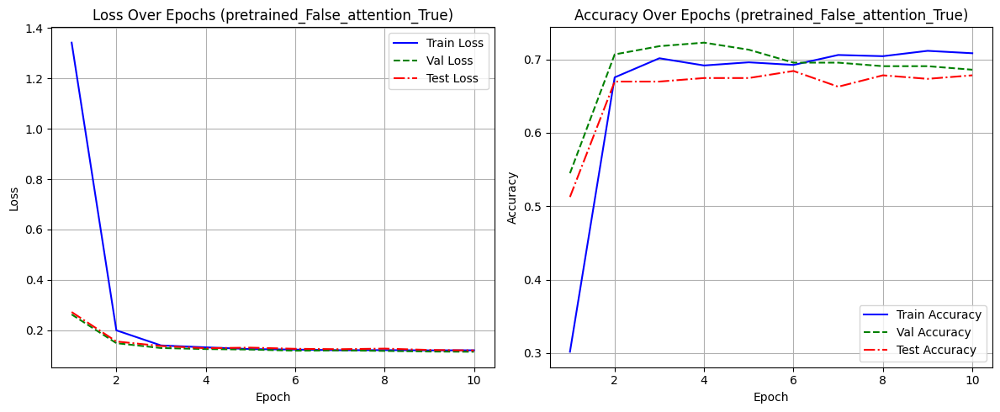


Training model: pretrained_False_attention_False


Epoch 1 (pretrained_False_attention_False): 100%|██████████| 60/60 [01:48<00:00,  1.81s/it]

Epoch 1, Training Loss (pretrained_False_attention_False): 1.3446, Training Accuracy: 0.2533


Epoch 1, Validation Loss (pretrained_False_attention_False): 0.2445, Validation Accuracy: 0.6490
Epoch 1, Test Loss (pretrained_False_attention_False): 0.2406, Test Accuracy: 0.6601


Epoch 2 (pretrained_False_attention_False): 100%|██████████| 60/60 [01:48<00:00,  1.81s/it]

Epoch 2, Training Loss (pretrained_False_attention_False): 0.1873, Training Accuracy: 0.6744


Epoch 2, Validation Loss (pretrained_False_attention_False): 0.1429, Validation Accuracy: 0.6907
Epoch 2, Test Loss (pretrained_False_attention_False): 0.1467, Test Accuracy: 0.6734


Epoch 3 (pretrained_False_attention_False): 100%|██████████| 60/60 [01:48<00:00,  1.81s/it]

Epoch 3, Training Loss (pretrained_False_attention_False): 0.1425, Training Accuracy: 0.7112


Epoch 3, Validation Loss (pretrained_False_attention_False): 0.1256, Validation Accuracy: 0.7163
Epoch 3, Test Loss (pretrained_False_attention_False): 0.1325, Test Accuracy: 0.6579


Epoch 4 (pretrained_False_attention_False): 100%|██████████| 60/60 [01:47<00:00,  1.79s/it]

Epoch 4, Training Loss (pretrained_False_attention_False): 0.1300, Training Accuracy: 0.6939


Epoch 4, Validation Loss (pretrained_False_attention_False): 0.1240, Validation Accuracy: 0.6827
Epoch 4, Test Loss (pretrained_False_attention_False): 0.1318, Test Accuracy: 0.6842


Epoch 5 (pretrained_False_attention_False): 100%|██████████| 60/60 [01:48<00:00,  1.81s/it]

Epoch 5, Training Loss (pretrained_False_attention_False): 0.1254, Training Accuracy: 0.6963


Epoch 5, Validation Loss (pretrained_False_attention_False): 0.1210, Validation Accuracy: 0.7051
Epoch 5, Test Loss (pretrained_False_attention_False): 0.1271, Test Accuracy: 0.6746


Epoch 6 (pretrained_False_attention_False): 100%|██████████| 60/60 [01:47<00:00,  1.79s/it]

Epoch 6, Training Loss (pretrained_False_attention_False): 0.1263, Training Accuracy: 0.6887


Epoch 6, Validation Loss (pretrained_False_attention_False): 0.1221, Validation Accuracy: 0.7276
Epoch 6, Test Loss (pretrained_False_attention_False): 0.1297, Test Accuracy: 0.6590


Epoch 7 (pretrained_False_attention_False): 100%|██████████| 60/60 [01:48<00:00,  1.80s/it]

Epoch 7, Training Loss (pretrained_False_attention_False): 0.3373, Training Accuracy: 0.6061


Epoch 7, Validation Loss (pretrained_False_attention_False): 0.2969, Validation Accuracy: 0.5962
Epoch 7, Test Loss (pretrained_False_attention_False): 0.2966, Test Accuracy: 0.5618


Epoch 8 (pretrained_False_attention_False): 100%|██████████| 60/60 [01:47<00:00,  1.79s/it]

Epoch 8, Training Loss (pretrained_False_attention_False): 0.2842, Training Accuracy: 0.5637


Epoch 8, Validation Loss (pretrained_False_attention_False): 0.2816, Validation Accuracy: 0.5673
Epoch 8, Test Loss (pretrained_False_attention_False): 0.2790, Test Accuracy: 0.5607
Early stopping at epoch 8 (pretrained_False_attention_False)


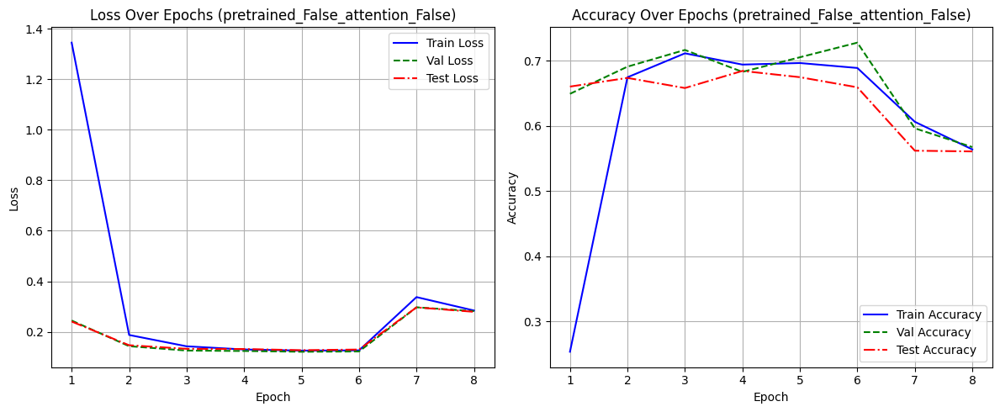

In [ ]:
def compute_accuracy(outputs, answers, vocab, inv_vocab):
    predicted = outputs.argmax(dim=-1)
    correct = 0
    total = 0
    for i in range(predicted.size(0)):
        pred_tokens = predicted[i].cpu().numpy()
        true_tokens = answers[i].cpu().numpy()
        pred_answer = []
        true_answer = []
        for token in pred_tokens:
            if token == vocab["<end>"]:
                break
            if token not in [vocab["<start>"], vocab["<pad>"]]:
                pred_answer.append(inv_vocab.get(token, inv_vocab[vocab["<unk>"]]))
        for token in true_tokens:
            if token == vocab["<end>"]:
                break
            if token not in [vocab["<start>"], vocab["<pad>"]]:
                true_answer.append(inv_vocab.get(token, inv_vocab[vocab["<unk>"]]))
        if " ".join(pred_answer) == " ".join(true_answer):
            correct += 1
        total += 1
    return correct / total if total > 0 else 0

def train_model(use_pretrained, use_attention, model_name):
    model = VQAModel(vocab_size=len(vocab), selected_classes=selected_classes, use_pretrained=use_pretrained, use_attention=use_attention).to(device)
    answer_criterion = nn.CrossEntropyLoss(ignore_index=0)
    question_type_criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.0005, weight_decay=1e-5)
    scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3, verbose=True)
    scaler = torch.amp.GradScaler('cuda')

    num_epochs = 10
    train_losses = []
    val_losses = []
    test_losses = []
    train_accuracies = []
    val_accuracies = []
    test_accuracies = []
    best_val_loss = float('inf')
    patience = 3
    early_stop_counter = 0

    for epoch in range(num_epochs):
        # Training
        model.train()
        total_train_loss = 0
        total_train_acc = 0
        for batch in tqdm(train_loader, desc=f"Epoch {epoch+1} ({model_name})"):
            images = batch["image"].to(device)
            questions = batch["question"].to(device)
            answers = batch["answer"].to(device)
            question_types = batch["question_type"].to(device)

            optimizer.zero_grad()
            with autocast(device_type='cuda'):
                outputs, question_type_logits = model(images, questions, answers[:, :-1])
                answer_loss = answer_criterion(outputs.contiguous().view(-1, len(vocab)), answers[:, 1:].contiguous().view(-1))
                question_type_loss = question_type_criterion(question_type_logits, question_types)
                loss = answer_loss + 0.3 * question_type_loss  # Combine losses
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            total_train_loss += loss.item()
            total_train_acc += compute_accuracy(outputs, answers[:, 1:], vocab, inv_vocab)

        avg_train_loss = total_train_loss / len(train_loader)
        avg_train_acc = total_train_acc / len(train_loader)
        train_losses.append(avg_train_loss)
        train_accuracies.append(avg_train_acc)
        print(f"Epoch {epoch+1}, Training Loss ({model_name}): {avg_train_loss:.4f}, Training Accuracy: {avg_train_acc:.4f}")

        # Validation
        model.eval()
        total_val_loss = 0
        total_val_acc = 0
        with torch.no_grad():
            for batch in val_loader:
                images = batch["image"].to(device)
                questions = batch["question"].to(device)
                answers = batch["answer"].to(device)
                question_types = batch["question_type"].to(device)
                with autocast(device_type='cuda'):
                    outputs, question_type_logits = model(images, questions, answers[:, :-1])
                    answer_loss = answer_criterion(outputs.contiguous().view(-1, len(vocab)), answers[:, 1:].contiguous().view(-1))
                    question_type_loss = question_type_criterion(question_type_logits, question_types)
                    loss = answer_loss + 0.3 * question_type_loss
                total_val_loss += loss.item()
                total_val_acc += compute_accuracy(outputs, answers[:, 1:], vocab, inv_vocab)

        avg_val_loss = total_val_loss / len(val_loader)
        avg_val_acc = total_val_acc / len(val_loader)
        val_losses.append(avg_val_loss)
        val_accuracies.append(avg_val_acc)
        print(f"Epoch {epoch+1}, Validation Loss ({model_name}): {avg_val_loss:.4f}, Validation Accuracy: {avg_val_acc:.4f}")

        # Test
        total_test_loss = 0
        total_test_acc = 0
        with torch.no_grad():
            for batch in test_loader:
                images = batch["image"].to(device)
                questions = batch["question"].to(device)
                answers = batch["answer"].to(device)
                question_types = batch["question_type"].to(device)
                with autocast(device_type='cuda'):
                    outputs, question_type_logits = model(images, questions, answers[:, :-1])
                    answer_loss = answer_criterion(outputs.contiguous().view(-1, len(vocab)), answers[:, 1:].contiguous().view(-1))
                    question_type_loss = question_type_criterion(question_type_logits, question_types)
                    loss = answer_loss + 0.3 * question_type_loss
                total_test_loss += loss.item()
                total_test_acc += compute_accuracy(outputs, answers[:, 1:], vocab, inv_vocab)

        avg_test_loss = total_test_loss / len(test_loader)
        avg_test_acc = total_test_acc / len(test_loader)
        test_losses.append(avg_test_loss)
        test_accuracies.append(avg_test_acc)
        print(f"Epoch {epoch+1}, Test Loss ({model_name}): {avg_test_loss:.4f}, Test Accuracy: {avg_test_acc:.4f}")

        scheduler.step(avg_val_loss)

        # Early stopping
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            early_stop_counter = 0
            torch.save(model.state_dict(), f"best_model_{model_name}.pth")
        else:
            early_stop_counter += 1
            if early_stop_counter >= patience:
                print(f"Early stopping at epoch {epoch+1} ({model_name})")
                break

    # Visualize metrics
    plt.figure(figsize=(12, 5))

    # Loss plot
    plt.subplot(1, 2, 1)
    plt.plot(range(1, len(train_losses) + 1), train_losses, label="Train Loss", color='b')
    plt.plot(range(1, len(val_losses) + 1), val_losses, label="Val Loss", color='g', linestyle='--')
    plt.plot(range(1, len(test_losses) + 1), test_losses, label="Test Loss", color='r', linestyle='-.')
    plt.title(f"Loss Over Epochs ({model_name})")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True)

    # Accuracy plot
    plt.subplot(1, 2, 2)
    plt.plot(range(1, len(train_accuracies) + 1), train_accuracies, label="Train Accuracy", color='b')
    plt.plot(range(1, len(val_accuracies) + 1), val_accuracies, label="Val Accuracy", color='g', linestyle='--')
    plt.plot(range(1, len(test_accuracies) + 1), test_accuracies, label="Test Accuracy", color='r', linestyle='-.')
    plt.title(f"Accuracy Over Epochs ({model_name})")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    return model, train_losses, val_losses, test_losses, train_accuracies, val_accuracies, test_accuracies, best_val_loss

# Train four models for the experiments
models_results = {}
for use_pretrained in [True, False]:
    for use_attention in [True, False]:
        model_name = f"pretrained_{use_pretrained}_attention_{use_attention}"
        print(f"\nTraining model: {model_name}")
        model, train_losses, val_losses, test_losses, train_accuracies, val_accuracies, test_accuracies, best_val_loss = train_model(use_pretrained, use_attention, model_name)
        models_results[model_name] = {
            "model": model,
            "train_losses": train_losses,
            "val_losses": val_losses,
            "test_losses": test_losses,
            "train_accuracies": train_accuracies,
            "val_accuracies": val_accuracies,
            "test_accuracies": test_accuracies,
            "best_val_loss": best_val_loss
        }

## Step 5: Evaluate and Test Model

Validation Accuracy (pretrained_True_attention_True): 0.8088, Test Accuracy (pretrained_True_attention_True): 0.7902
Validation Accuracy (pretrained_True_attention_False): 0.7892, Test Accuracy (pretrained_True_attention_False): 0.7951
Validation Accuracy (pretrained_False_attention_True): 0.6814, Test Accuracy (pretrained_False_attention_True): 0.6829
Validation Accuracy (pretrained_False_attention_False): 0.7108, Test Accuracy (pretrained_False_attention_False): 0.6732

Model Comparison Table:
                              Model  Validation Accuracy  Test Accuracy  \
0    pretrained_True_attention_True             0.808824       0.790244   
1   pretrained_True_attention_False             0.789216       0.795122   
2   pretrained_False_attention_True             0.681373       0.682927   
3  pretrained_False_attention_False             0.710784       0.673171   

   Best Validation Loss  
0              0.030389  
1              0.030614  
2              0.115064  
3              0.12

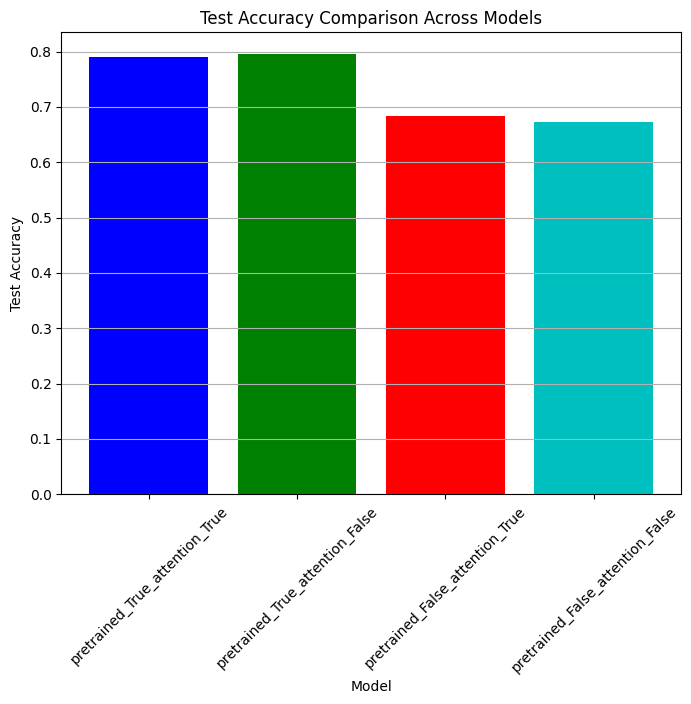


Testing model: pretrained_True_attention_True

Test Case 1:


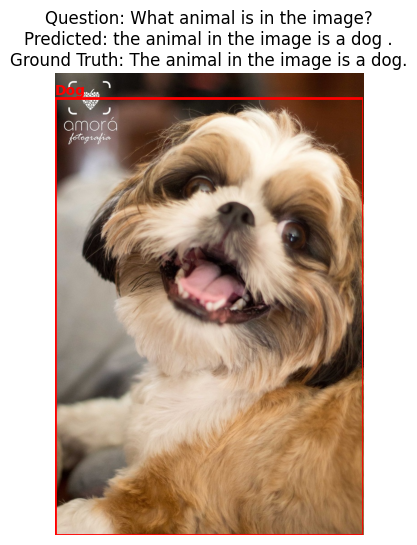

Image Path: /root/fiftyone/open-images-v6/validation/data/062467895c0985e0.jpg
Question: What animal is in the image?
Predicted Answer: the animal in the image is a dog .
Ground Truth: The animal in the image is a dog.

Test Case 2:


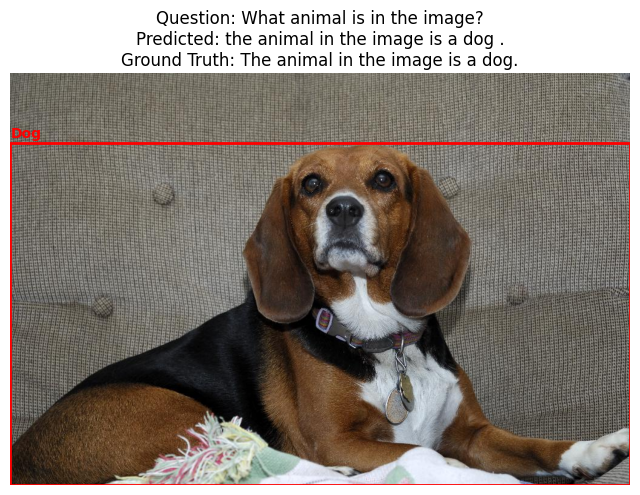

Image Path: /root/fiftyone/open-images-v6/validation/data/0bdc824059594c8d.jpg
Question: What animal is in the image?
Predicted Answer: the animal in the image is a dog .
Ground Truth: The animal in the image is a dog.

Test Case 3:


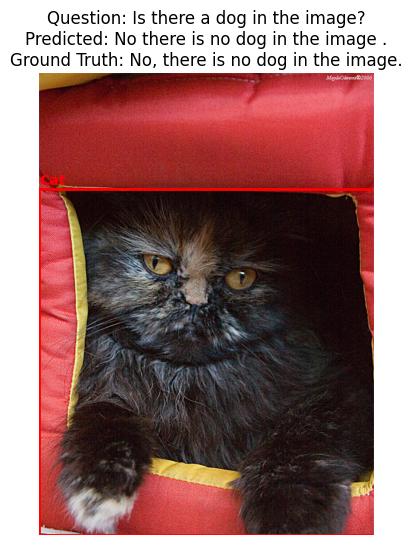

Image Path: /root/fiftyone/open-images-v6/validation/data/0d63660f48902dc5.jpg
Question: Is there a dog in the image?
Predicted Answer: No there is no dog in the image .
Ground Truth: No, there is no dog in the image.

Test Case 4:


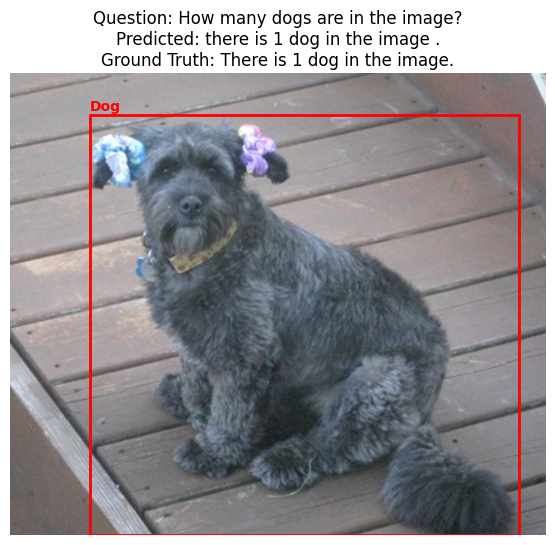

Image Path: /root/fiftyone/open-images-v6/validation/data/052b579fce6e42ac.jpg
Question: How many dogs are in the image?
Predicted Answer: there is 1 dog in the image .
Ground Truth: There is 1 dog in the image.

Testing model: pretrained_True_attention_False

Test Case 1:


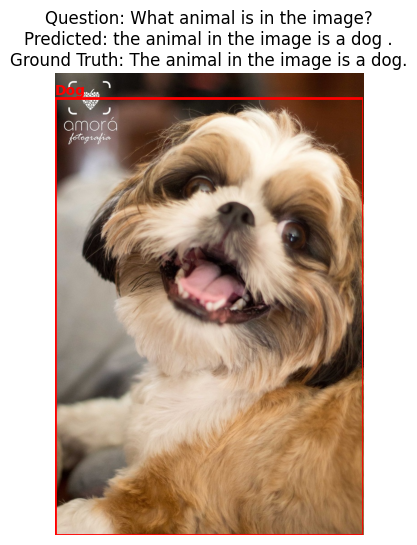

Image Path: /root/fiftyone/open-images-v6/validation/data/062467895c0985e0.jpg
Question: What animal is in the image?
Predicted Answer: the animal in the image is a dog .
Ground Truth: The animal in the image is a dog.

Test Case 2:


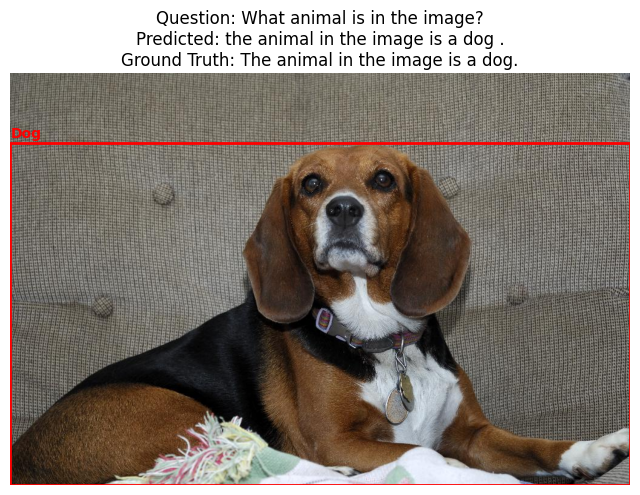

Image Path: /root/fiftyone/open-images-v6/validation/data/0bdc824059594c8d.jpg
Question: What animal is in the image?
Predicted Answer: the animal in the image is a dog .
Ground Truth: The animal in the image is a dog.

Test Case 3:


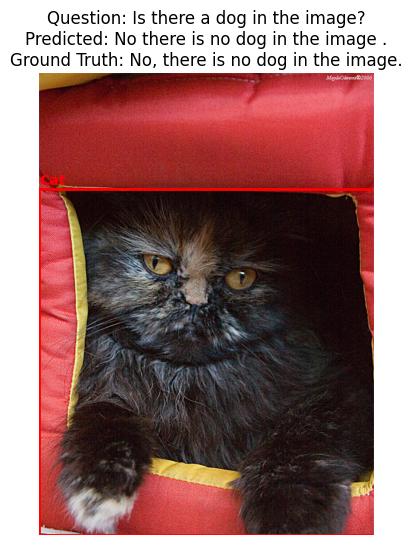

Image Path: /root/fiftyone/open-images-v6/validation/data/0d63660f48902dc5.jpg
Question: Is there a dog in the image?
Predicted Answer: No there is no dog in the image .
Ground Truth: No, there is no dog in the image.

Test Case 4:


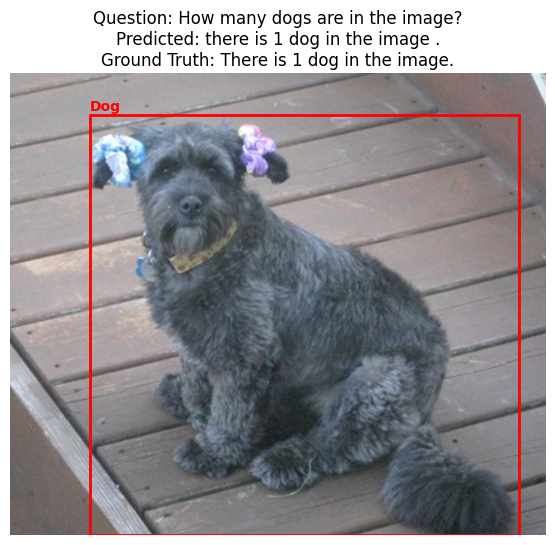

Image Path: /root/fiftyone/open-images-v6/validation/data/052b579fce6e42ac.jpg
Question: How many dogs are in the image?
Predicted Answer: there is 1 dog in the image .
Ground Truth: There is 1 dog in the image.

Testing model: pretrained_False_attention_True

Test Case 1:


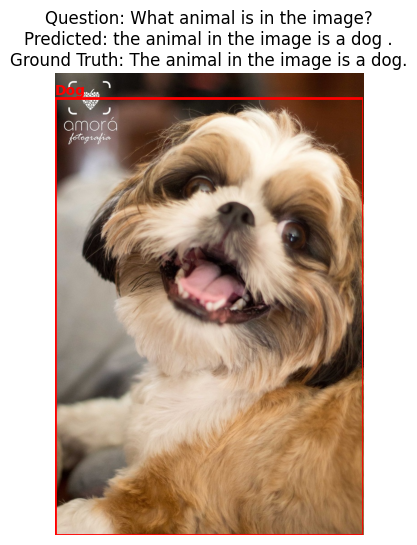

Image Path: /root/fiftyone/open-images-v6/validation/data/062467895c0985e0.jpg
Question: What animal is in the image?
Predicted Answer: the animal in the image is a dog .
Ground Truth: The animal in the image is a dog.

Test Case 2:


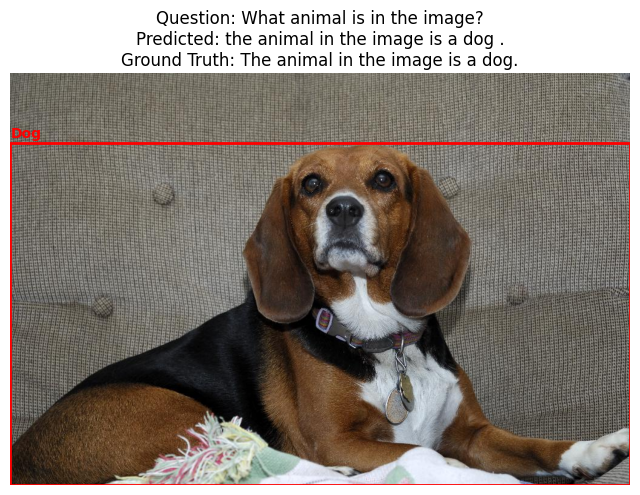

Image Path: /root/fiftyone/open-images-v6/validation/data/0bdc824059594c8d.jpg
Question: What animal is in the image?
Predicted Answer: the animal in the image is a dog .
Ground Truth: The animal in the image is a dog.

Test Case 3:


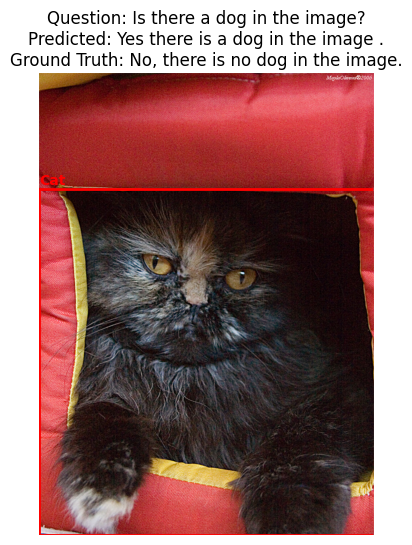

Image Path: /root/fiftyone/open-images-v6/validation/data/0d63660f48902dc5.jpg
Question: Is there a dog in the image?
Predicted Answer: Yes there is a dog in the image .
Ground Truth: No, there is no dog in the image.

Test Case 4:


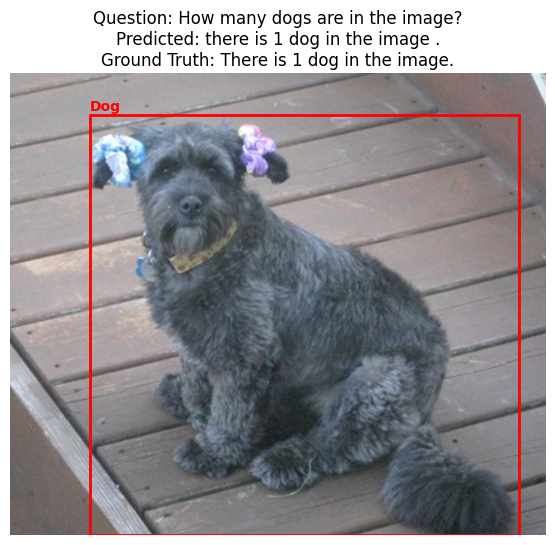

Image Path: /root/fiftyone/open-images-v6/validation/data/052b579fce6e42ac.jpg
Question: How many dogs are in the image?
Predicted Answer: there is 1 dog in the image .
Ground Truth: There is 1 dog in the image.

Testing model: pretrained_False_attention_False

Test Case 1:


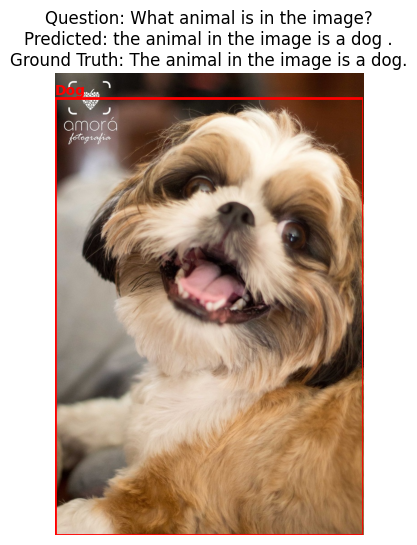

Image Path: /root/fiftyone/open-images-v6/validation/data/062467895c0985e0.jpg
Question: What animal is in the image?
Predicted Answer: the animal in the image is a dog .
Ground Truth: The animal in the image is a dog.

Test Case 2:


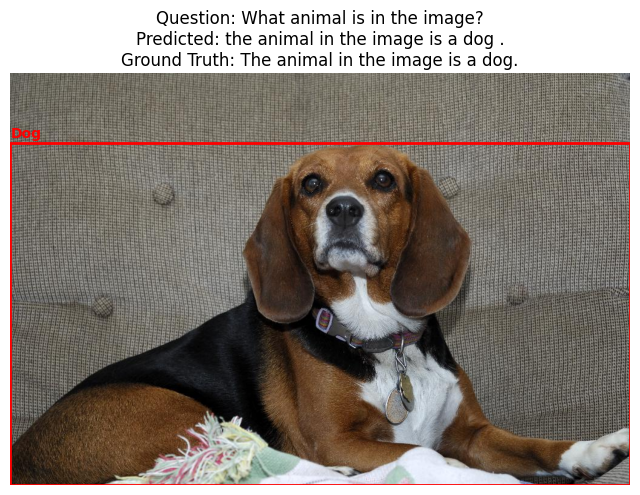

Image Path: /root/fiftyone/open-images-v6/validation/data/0bdc824059594c8d.jpg
Question: What animal is in the image?
Predicted Answer: the animal in the image is a dog .
Ground Truth: The animal in the image is a dog.

Test Case 3:


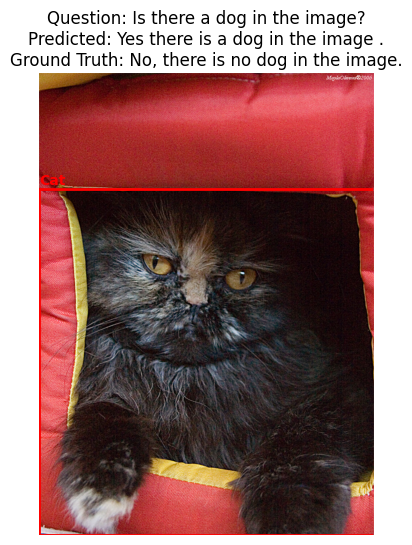

Image Path: /root/fiftyone/open-images-v6/validation/data/0d63660f48902dc5.jpg
Question: Is there a dog in the image?
Predicted Answer: Yes there is a dog in the image .
Ground Truth: No, there is no dog in the image.

Test Case 4:


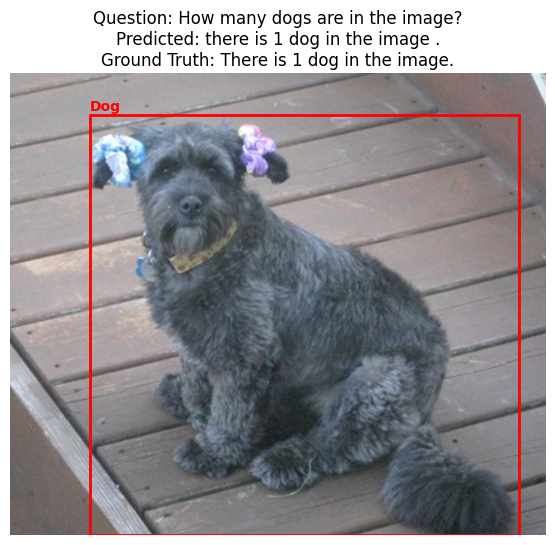

Image Path: /root/fiftyone/open-images-v6/validation/data/052b579fce6e42ac.jpg
Question: How many dogs are in the image?
Predicted Answer: there is 1 dog in the image .
Ground Truth: There is 1 dog in the image.


In [ ]:
def evaluate_accuracy(model, data_loader):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for batch in data_loader:
            images = batch["image"].to(device)
            questions = batch["question"].to(device)
            answers = batch["answer"].to(device)
            outputs, _ = model(images, questions)
            predicted = outputs.argmax(dim=-1)

            for i in range(predicted.size(0)):
                pred_tokens = predicted[i].cpu().numpy()
                true_tokens = answers[i].cpu().numpy()
                pred_answer = []
                true_answer = []
                for token in pred_tokens:
                    if token == val_dataset.vocab["<end>"]:
                        break
                    if token not in [val_dataset.vocab["<start>"], val_dataset.vocab["<pad>"]]:
                        pred_answer.append(val_dataset.inv_vocab.get(token, val_dataset.inv_vocab[val_dataset.vocab["<unk>"]]))
                for token in true_tokens:
                    if token == val_dataset.vocab["<end>"]:
                        break
                    if token not in [val_dataset.vocab["<start>"], val_dataset.vocab["<pad>"]]:
                        true_answer.append(val_dataset.inv_vocab.get(token, val_dataset.inv_vocab[val_dataset.vocab["<unk>"]]))
                if " ".join(pred_answer) == " ".join(true_answer):
                    correct += 1
            total += predicted.size(0)
    return correct / total if total > 0 else 0

def post_process_answer(predicted_answer, question_type):
    predicted_answer = predicted_answer.strip()
    if question_type == "yes_no":
        if not (predicted_answer.startswith("yes") or predicted_answer.startswith("no")):
            # If the answer doesn't start with "yes" or "no", force it to match the yes/no structure
            if "yes" in predicted_answer.lower():
                predicted_answer = "Yes, there is a " + predicted_answer.split("than")[0].split()[-2] + " in the image."
            else:
                predicted_answer = "No, there is no " + predicted_answer.split("than")[0].split()[-2] + " in the image."
    elif question_type == "comparative":
        if not ("more" in predicted_answer and "than" in predicted_answer):
            # If the answer doesn't match the comparative structure, adjust it
            if "yes" in predicted_answer.lower():
                predicted_answer = "Yes, there are more " + predicted_answer.split()[-3] + "s than " + predicted_answer.split()[-1] + "s in the image."
            else:
                predicted_answer = "No, there are not more " + predicted_answer.split()[-3] + "s than " + predicted_answer.split()[-1] + "s in the image."
    return predicted_answer

def test_example(model, image_path, question, dataset):
    model.eval()
    image = Image.open(image_path).convert("RGB")
    image_tensor = dataset.transform(image).unsqueeze(0).to(device)
    question_tensor = encode_text(question, dataset.max_seq_length, dataset.vocab).unsqueeze(0).to(device)

    # Find ground truth and detections
    ground_truth = None
    detections = None
    for sample in dataset._dataset:
        if sample.filepath == image_path:
            for item in dataset.data:
                if item["image_path"] == image_path and item["question"].lower().strip() == question.lower().strip():
                    ground_truth = item["answer"]
                    break
            detections = sample.ground_truth.detections if sample.ground_truth else []
            break

    with torch.no_grad():
        outputs, question_type_logits = model(image_tensor, question_tensor)
        answer_tokens = outputs.argmax(dim=-1).squeeze(0).cpu().numpy()
        question_type_idx = question_type_logits.argmax(dim=-1).item()
        question_type = model.question_types[question_type_idx]

    answer = []
    for token in answer_tokens:
        if token == dataset.vocab["<end>"]:
            break
        if token not in [val_dataset.vocab["<start>"], val_dataset.vocab["<pad>"]]:
            answer.append(dataset.inv_vocab.get(token, dataset.inv_vocab[dataset.vocab["<unk>"]]))
    predicted_answer = " ".join(answer)

    # Post-process the predicted answer
    predicted_answer = predicted_answer.replace(" , ", " ")
    predicted_answer = post_process_answer(predicted_answer, question_type)
    if predicted_answer.startswith("yes") or predicted_answer.startswith("no"):
        predicted_answer = predicted_answer[0].upper() + predicted_answer[1:]

    # Visualize the image with bounding boxes
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.imshow(image)
    ax.axis('off')
    ax.set_title(f"Question: {question}\nPredicted: {predicted_answer}\nGround Truth: {ground_truth}", fontsize=12)

    for detection in detections:
        label = detection.label
        if label in ["Dog", "Horse", "Cat"]:
            bbox = detection.bounding_box
            img_width, img_height = image.size
            x = bbox[0] * img_width
            y = bbox[1] * img_height
            w = bbox[2] * img_width
            h = bbox[3] * img_height
            rect = plt.Rectangle((x, y), w, h, linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            ax.text(x, y - 10, label, color='red', fontsize=10, weight='bold')

    plt.show()

    print(f"Image Path: {image_path}")
    print(f"Question: {question}")
    print(f"Predicted Answer: {predicted_answer}")
    print(f"Ground Truth: {ground_truth}")
    return predicted_answer, ground_truth

# Evaluate all models
results_table = []
for model_name, results in models_results.items():
    model = results["model"]
    model.load_state_dict(torch.load(f"best_model_{model_name}.pth"))
    val_accuracy = evaluate_accuracy(model, val_loader)
    test_accuracy = evaluate_accuracy(model, test_loader)
    results_table.append({
        "Model": model_name,
        "Validation Accuracy": val_accuracy,
        "Test Accuracy": test_accuracy,
        "Best Validation Loss": results["best_val_loss"]
    })
    print(f"Validation Accuracy ({model_name}): {val_accuracy:.4f}, Test Accuracy ({model_name}): {test_accuracy:.4f}")

# Display results table
import pandas as pd
df = pd.DataFrame(results_table)
print("\nModel Comparison Table:")
print(df)

# Visualize test accuracy comparison
plt.figure(figsize=(8, 6))
model_names = [result["Model"] for result in results_table]
test_accuracies = [result["Test Accuracy"] for result in results_table]
plt.bar(model_names, test_accuracies, color=['b', 'g', 'r', 'c'])
plt.title("Test Accuracy Comparison Across Models")
plt.xlabel("Model")
plt.ylabel("Test Accuracy")
plt.xticks(rotation=45)
plt.grid(True, axis='y')
plt.show()

# Select test cases (all images contain animals)
test_cases = []
used_image_paths = set()
question_types = ["How many", "Is there", "What animal", "Are there more"]
for i, item in enumerate(test_vqa_data):
    image_path = item["image_path"]
    question = item["question"]
    if any(qt in question for qt in question_types) and image_path not in used_image_paths:
        test_cases.append({"image_path": image_path, "question": question})
        used_image_paths.add(image_path)
        if len(test_cases) >= 4:
            break

while len(test_cases) < 4:
    for i, item in enumerate(test_vqa_data):
        image_path = item["image_path"]
        question = item["question"]
        if any(qt in question for qt in question_types) and image_path not in used_image_paths:
            test_cases.append({"image_path": image_path, "question": question})
            used_image_paths.add(image_path)
            break

# Test all models on the same test cases
for model_name, results in models_results.items():
    model = results["model"]
    model.load_state_dict(torch.load(f"best_model_{model_name}.pth"))
    print(f"\nTesting model: {model_name}")
    for i, test_case in enumerate(test_cases, 1):
        print(f"\nTest Case {i}:")
        test_example(model, test_case["image_path"], test_case["question"], test_dataset)